## EDA Clustering

1. Ask at least 5 questions about the data, keeping in mind that your target variable is logerror. e.g. Is logerror significantly different for properties in LA County vs Orange County vs Ventura County?

2. Answer those questions through a mix of statistical tests and visualizations.

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import cm

from sklearn.model_selection import learning_curve

from importlib import reload
import wrangle_zillow as wz

pd.options.display.float_format = '{:,.3f}'.format

In [46]:
reload(wz)

<module 'wrangle_zillow' from '/Users/nadina/codeup-data-science/clustering-exercises/wrangle_zillow.py'>

In [47]:
#df = pd.read_csv('clean_zillow.csv')

#df = wz.transform_columns(df)
train, _, _ = wz.split_zillow(wz.get_zillow2())

In [48]:
train_cat, _, _ = wz.split_zillow(wz.get_zillow())

In [10]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
sqft,"28,329.000","1,907.759",956.422,300.000,"1,272.000","1,658.000","2,291.000","17,245.000"
garage_sqft,"28,329.000",169.624,251.302,0.000,0.000,0.000,430.000,"4,251.000"
lot_sqft,"28,329.000","10,544.011","75,419.153",236.000,"5,579.000","6,825.000","8,686.000","6,971,010.000"
age,"28,329.000",53.557,22.874,1.000,38.000,57.000,67.000,137.000
structure_price,"28,329.000","192,527.323","237,223.457",148.000,"77,074.000","131,275.000","224,000.000","7,507,773.000"
price,"28,329.000","519,443.666","694,176.356","3,254.000","194,062.000","371,362.000","609,122.000","25,381,250.000"
land_price,"28,329.000","326,916.344","515,739.897",161.000,"74,758.000","216,930.000","405,000.000","22,335,500.000"
tax_amount,"28,329.000","6,326.263","8,009.101",51.260,"2,662.700","4,618.910","7,263.100","290,998.060"
latitude,"28,329.000","34,023,519.508","274,457.677","33,341,224.000","33,828,228.000","34,022,848.000","34,188,245.000","34,812,397.000"
longitude,"28,329.000","-118,192,974.607","357,001.700","-119,447,944.000","-118,399,355.000","-118,151,544.000","-117,929,326.000","-117,554,636.000"


In [18]:
train_cat

(       sqft  garage_sqft  lot_sqft  age  structure_price   price  land_price  \
 35466   750            0      5200   68            35480  155984      120504   
 27229  2498          588     22040   30           266275  434987      168712   
 20292  1677            0      6038   68           162465  349096      186631   
 15765  1615            0      6048   77            95000  476000      381000   
 31886  7942            0     47644   47           329298  627515      298217   
 ...     ...          ...       ...  ...              ...     ...         ...   
 1942   1891            0      6241   69           157600  476200      318600   
 4773   2299            0      7970   50           251019  522665      271646   
 9370   1112            0      5285   66            78525  211037      132512   
 39849  1600            0      6258   79           140000  269146      129146   
 39906  2912          608     18551   18           321623  565425      243802   
 
        tax_amount  latitu

In [22]:
train_cat.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
sqft,"28,329.000",NaN,NaN,NaN,"1,907.759",956.422,300.000,"1,272.000","1,658.000","2,291.000","17,245.000"
garage_sqft,"28,329.000",NaN,NaN,NaN,169.624,251.302,0.000,0.000,0.000,430.000,"4,251.000"
lot_sqft,"28,329.000",NaN,NaN,NaN,"10,544.011","75,419.153",236.000,"5,579.000","6,825.000","8,686.000","6,971,010.000"
age,"28,329.000",NaN,NaN,NaN,53.557,22.874,1.000,38.000,57.000,67.000,137.000
structure_price,"28,329.000",NaN,NaN,NaN,"192,527.323","237,223.457",148.000,"77,074.000","131,275.000","224,000.000","7,507,773.000"
price,"28,329.000",NaN,NaN,NaN,"519,443.666","694,176.356","3,254.000","194,062.000","371,362.000","609,122.000","25,381,250.000"
land_price,"28,329.000",NaN,NaN,NaN,"326,916.344","515,739.897",161.000,"74,758.000","216,930.000","405,000.000","22,335,500.000"
tax_amount,"28,329.000",NaN,NaN,NaN,"6,326.263","8,009.101",51.260,"2,662.700","4,618.910","7,263.100","290,998.060"
latitude,"28,329.000",NaN,NaN,NaN,"34,023,519.508","274,457.677","33,341,224.000","33,828,228.000","34,022,848.000","34,188,245.000","34,812,397.000"
longitude,"28,329.000",NaN,NaN,NaN,"-118,192,974.607","357,001.700","-119,447,944.000","-118,399,355.000","-118,151,544.000","-117,929,326.000","-117,554,636.000"


In [51]:
numerical_columns = train.iloc[:, :10].columns.tolist()
categorical_columns = train.iloc[:, 10:-1].columns.tolist()
target = np.abs(train.logerror)

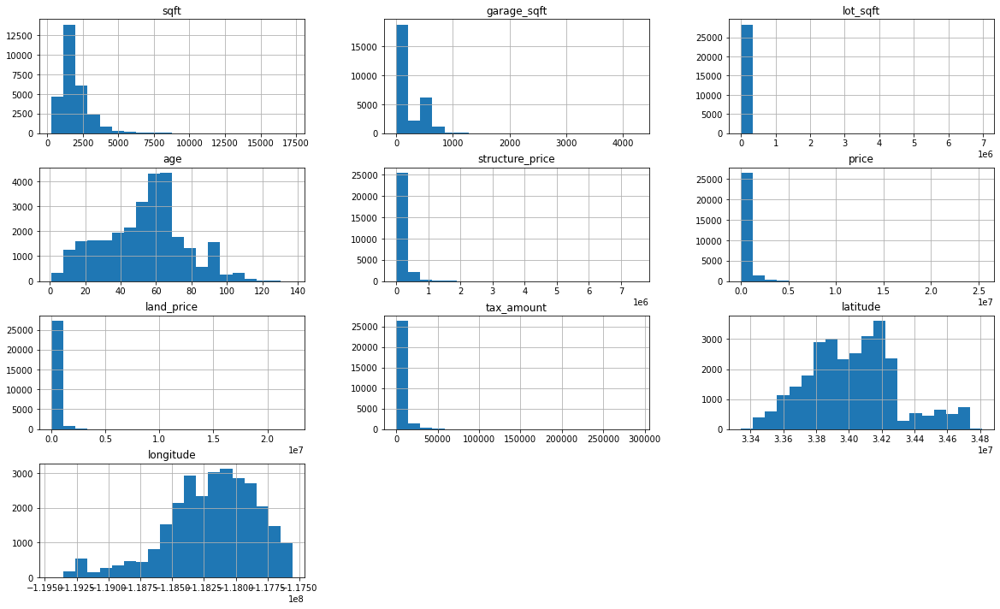

In [29]:
train[numerical_columns].hist(bins=20, figsize=(20, 12));

In [111]:
df.logerror.min()

-4.65542037764

In [112]:
df.logerror.max()

5.2629986498

In [115]:
df.shape[0]

51616

In [118]:
q1 = df.logerror.quantile(0.01)
q3 = df.logerror.quantile(0.99)
df = df[(df.logerror > q1) & (df.logerror < q3)]
#((df.logerror > q1) & (df.logerror < q3)).sum()

In [119]:
df.shape[0]

50582

In [120]:
51616 - 50582

1034

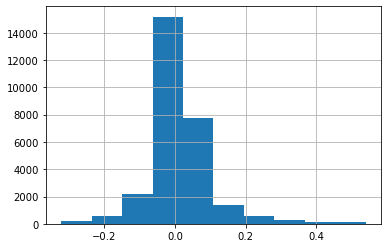

In [24]:
train.logerror.hist();

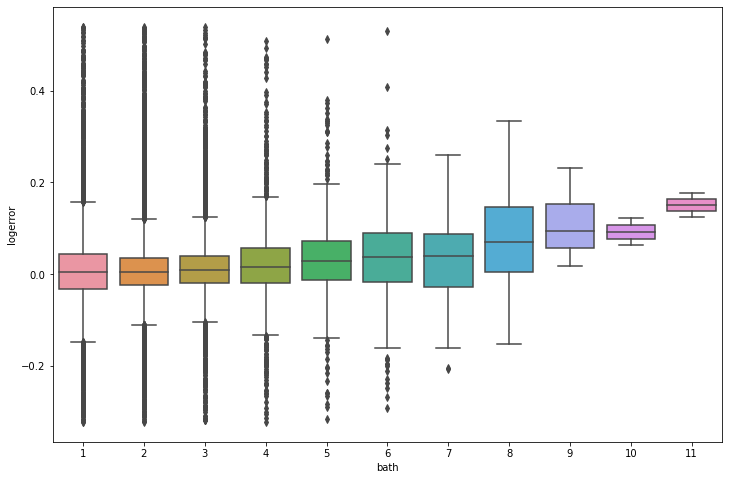

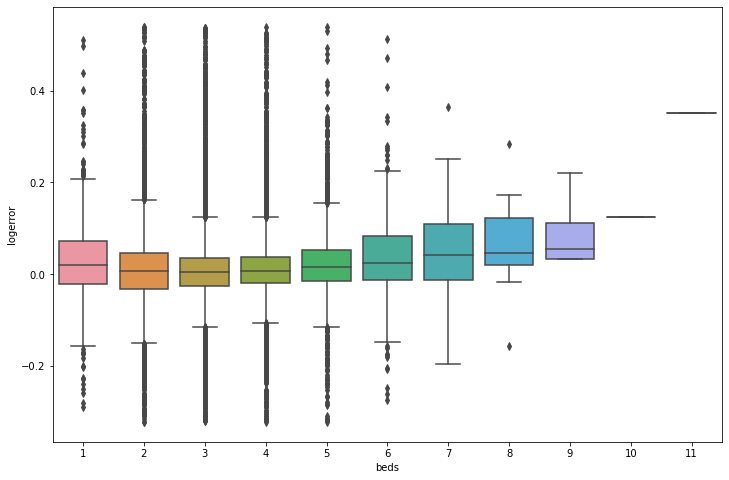

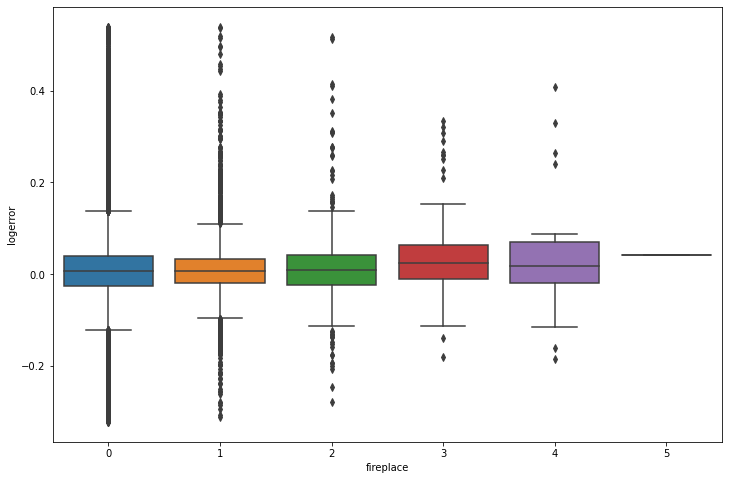

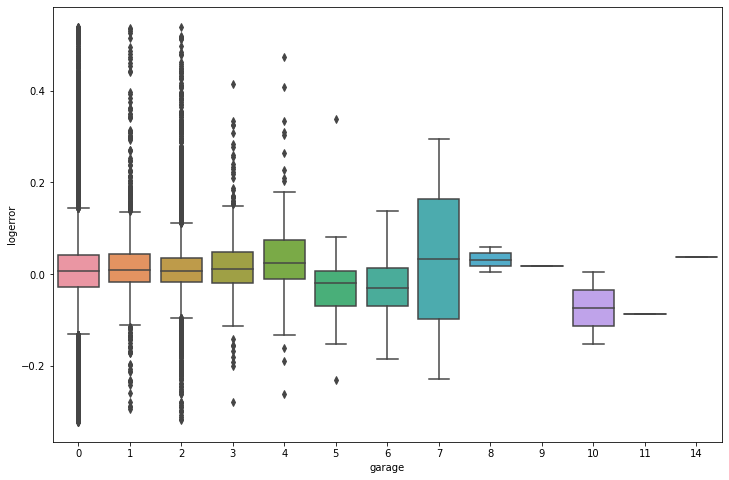

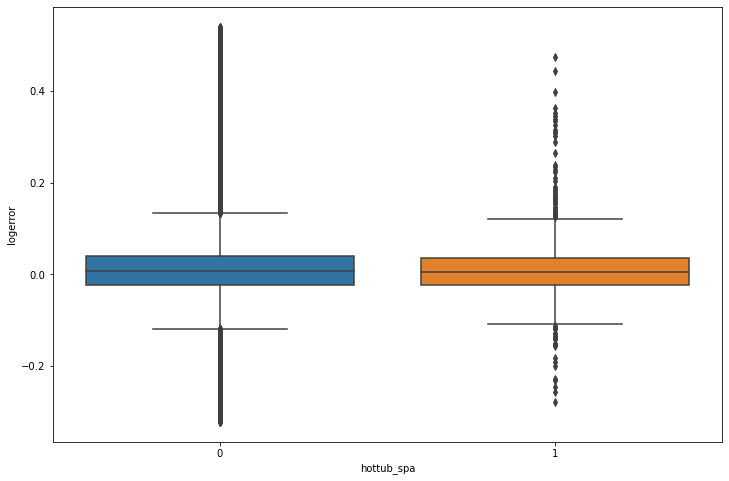

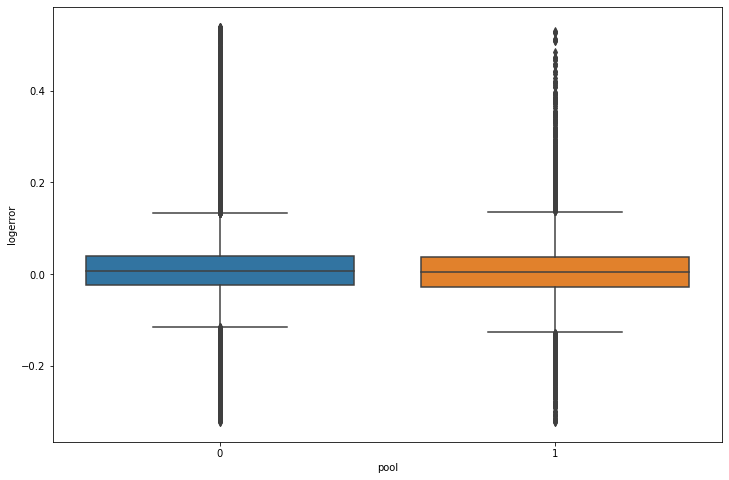

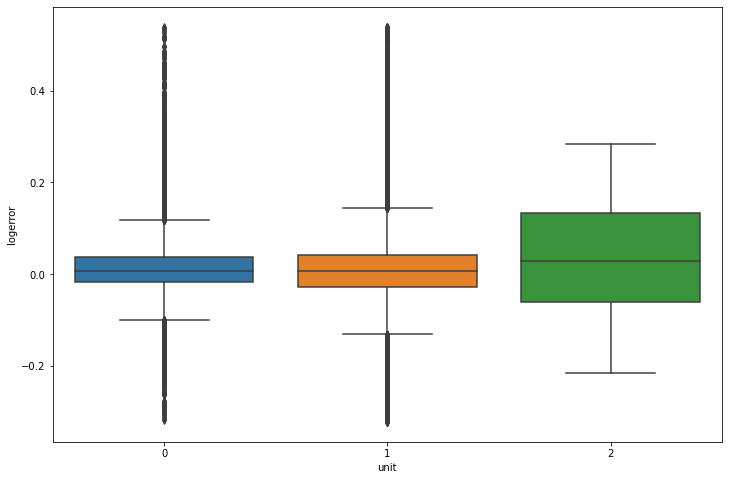

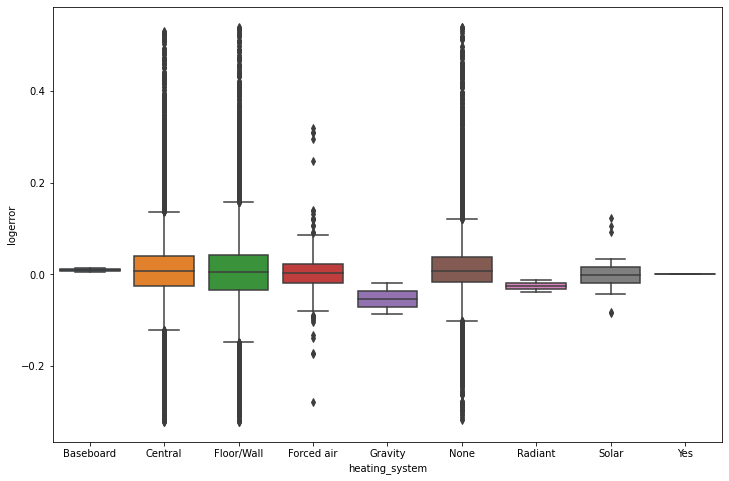

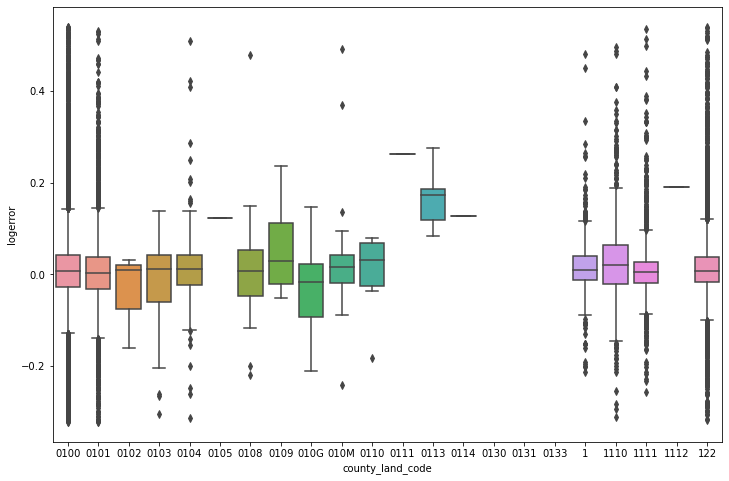

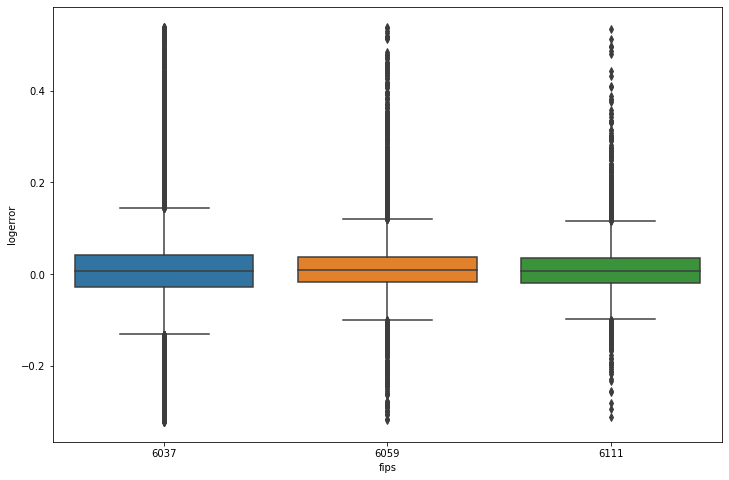

In [26]:
for col in categorical_columns:
    plt.figure(figsize=(12,8))
    sns.boxplot(x=train[col], y=target)
    plt.show()

In [134]:
# boxplot takeaways:

* ```bath``` till 7 almost no changes in ```logerror```
* ```beds```   till 6 almost no changes in   ```logerror```
* ```fireplace``` no changes in target
* ```garage``` till 4 almost equal ```logerror```
* ```hottub_spa``` equal
* ```pool``` equal
* ```unite``` 0, 1 equal, 2 changes, 3 needs to be explored
* ```heating_system``` vary a lot
* ```county_land_code``` vary a lot
* ```fips``` almost equal

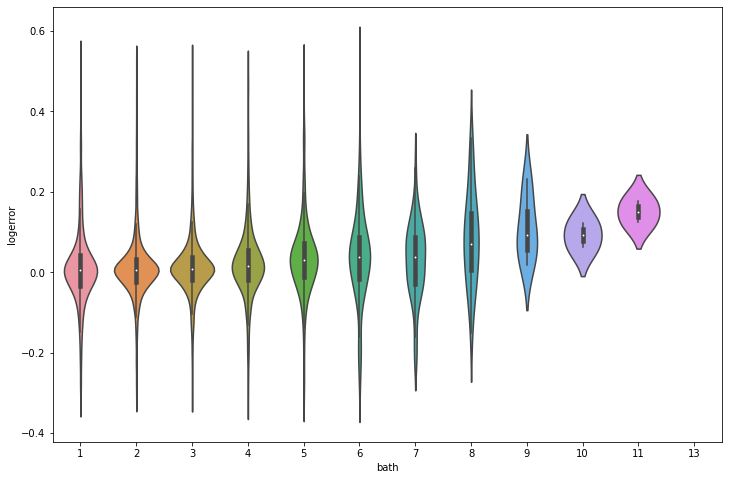

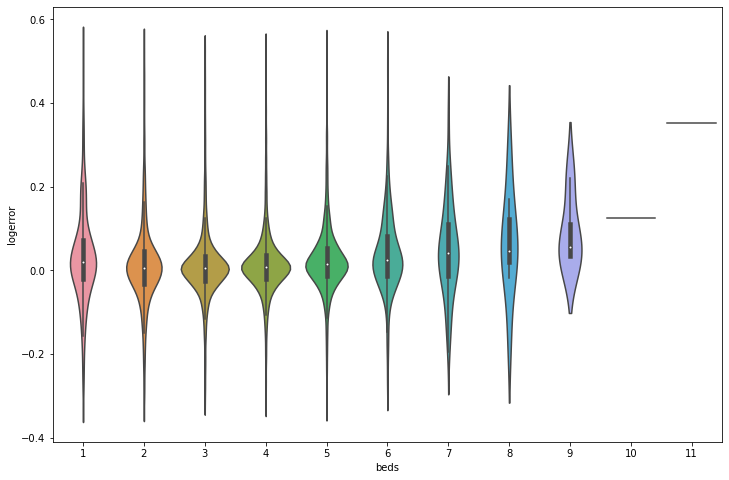

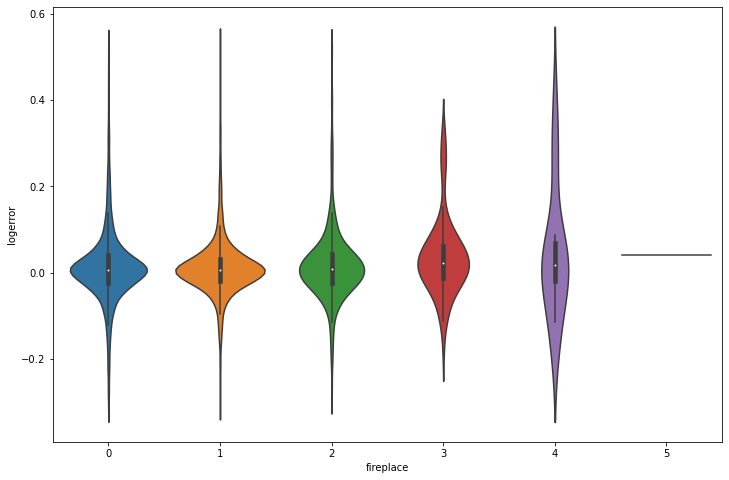

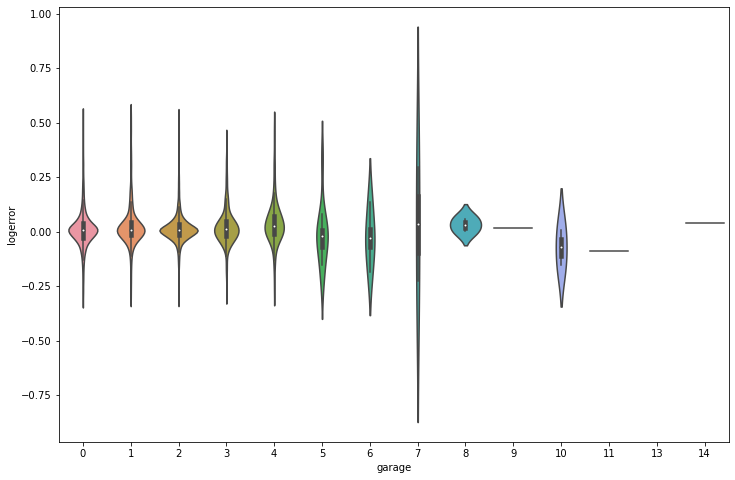

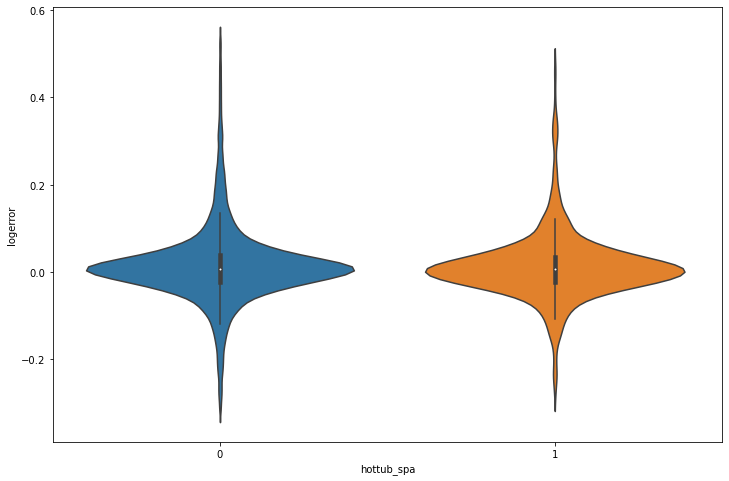

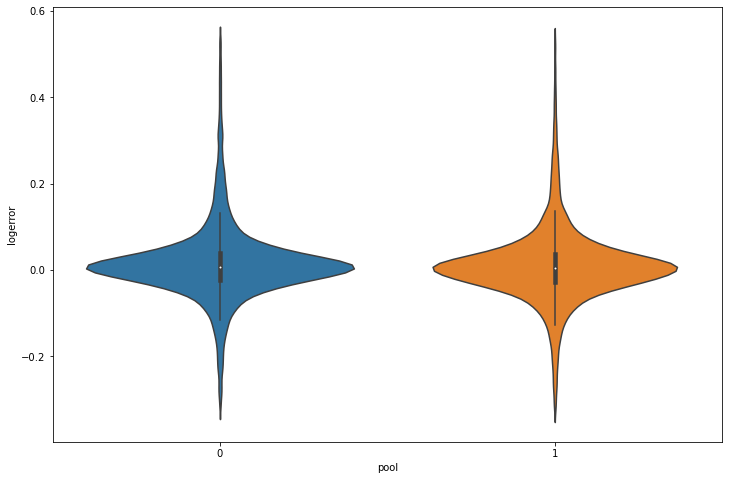

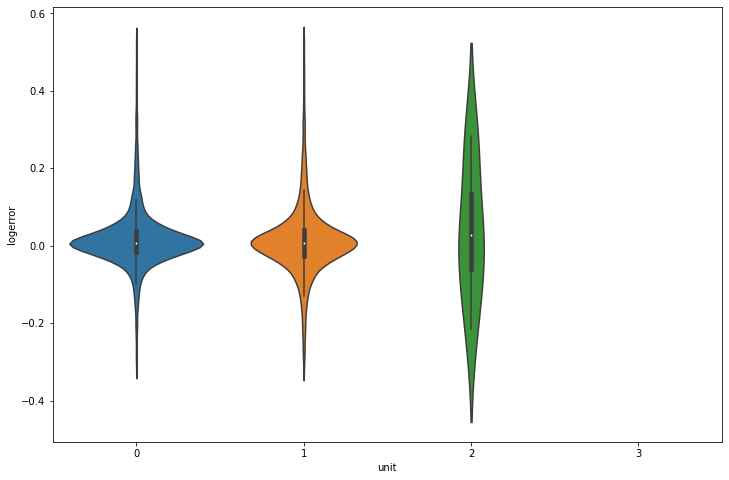

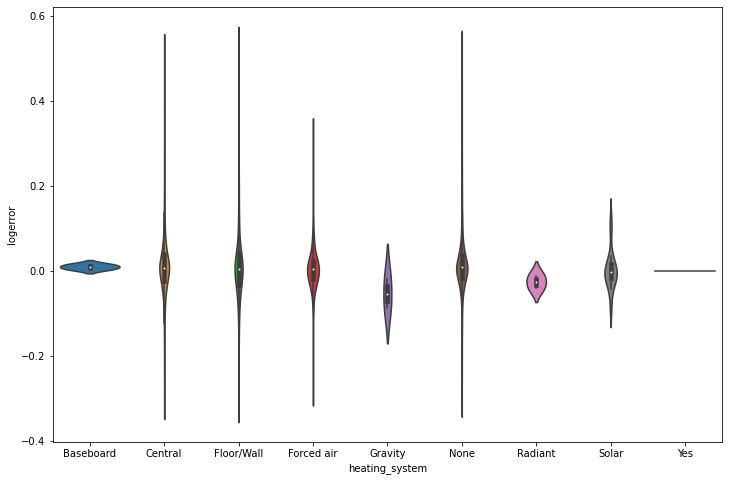

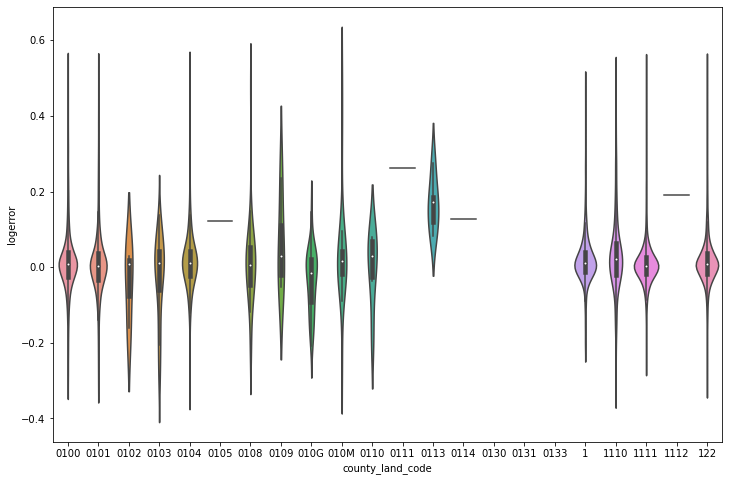

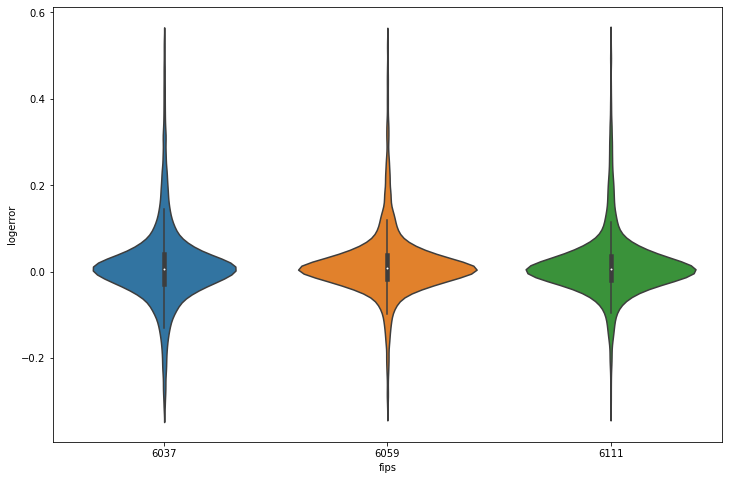

In [135]:
for col in categorical_columns:
    plt.figure(figsize=(12,8))
    sns.violinplot(x=train[col], y=target)
    plt.show()

In [34]:
#train.sample(frac=0.05).hist(bins=20, figsize=(20, 12));

In [52]:
sample = train.sample(frac=0.05)

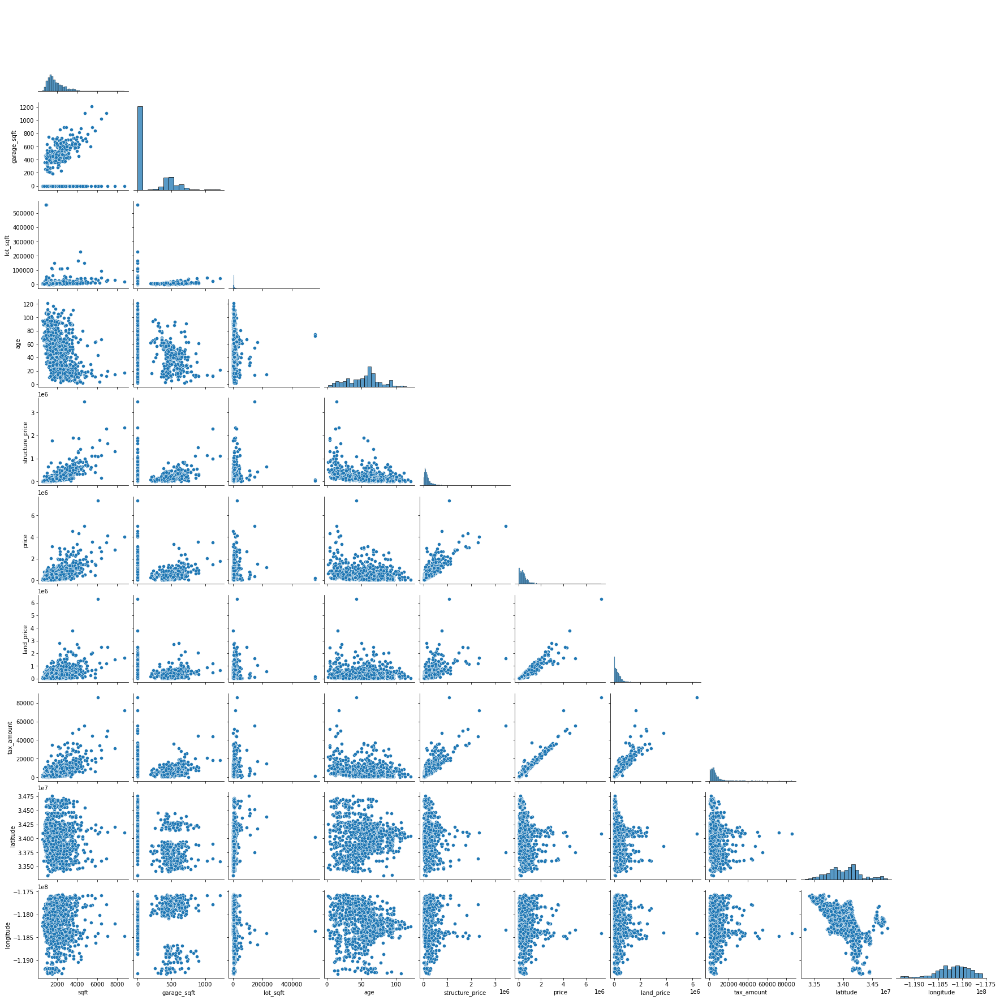

In [38]:
sns.pairplot(data=sample[numerical_columns], corner=True);

In [39]:
# strong correlations:

- ```price``` - ```tax_amount```, ```price``` - ```land_price```, ```land_price``` - ```tax_amount```

In [43]:
train.columns

Index(['sqft', 'garage_sqft', 'lot_sqft', 'age', 'structure_price', 'price',
       'land_price', 'tax_amount', 'latitude', 'longitude', 'bath', 'beds',
       'fireplace', 'garage', 'hottub_spa', 'pool', 'unit', 'heating_system',
       'county_land_code', 'fips', 'logerror'],
      dtype='object')

#### 1. How different is ```logerror``` in different counties?

<Figure size 864x576 with 0 Axes>

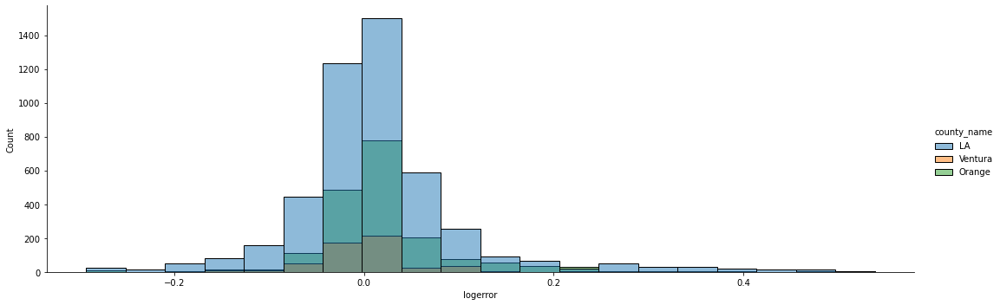

In [66]:
plt.figure(figsize=(12, 8))
sns.displot(data=sample, x='logerror', bins=20, weights=5, aspect=3, hue='county_name')
plt.show()

### 2. How differ the ```logerror``` for different ```heating_system```?

<Figure size 864x576 with 0 Axes>

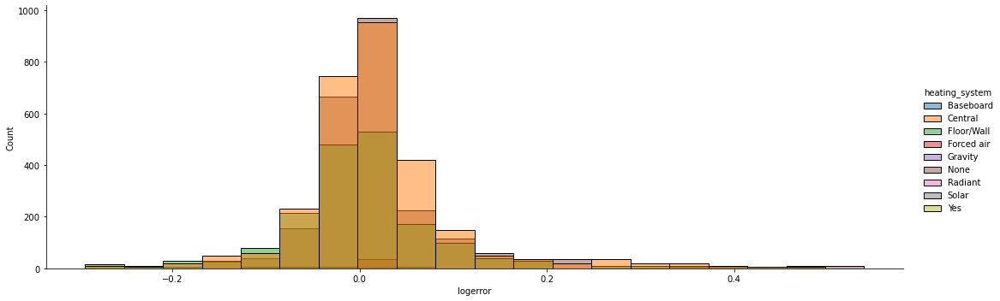

In [68]:
plt.figure(figsize=(12, 8))
sns.displot(data=sample, x='logerror', bins=20, weights=5, aspect=3, hue='heating_system')
plt.show()

In [81]:
sample.heating_system.unique().tolist()

['Central', 'Floor/Wall', 'None', 'Forced air', 'Solar']

In [80]:
len(sample.heating_system.unique().tolist())

5

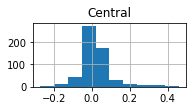

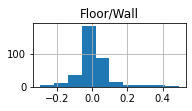

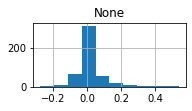

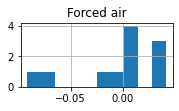

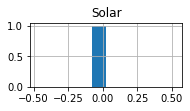

In [83]:
#plt.figure(figsize=(20, 12))
for i, value in enumerate(sample.heating_system.unique().tolist()):
    plt.subplot(3, 2, i+1)
    sample[sample.heating_system == value].logerror.hist(bins=10)
    plt.title(value)
    plt.xlim=(0, 900)
    plt.ylim=(0, 0.6)
    plt.show()
plt.show()

In [2]:
!cp wrangle_zillow.py wrangle.py

In [3]:
!code wrangle.py

<Figure size 864x576 with 0 Axes>

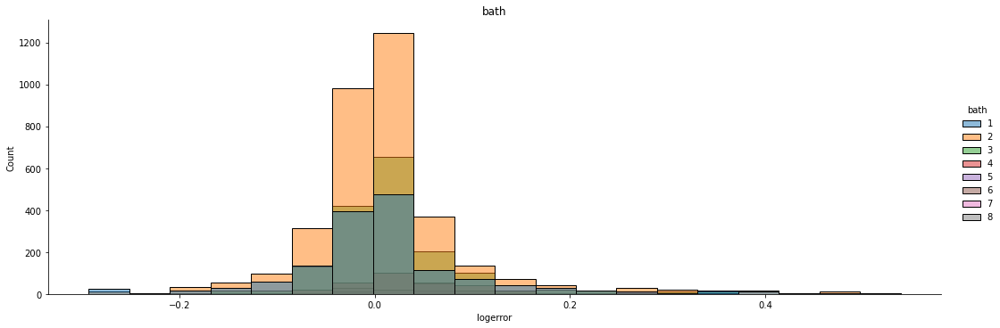

<Figure size 864x576 with 0 Axes>

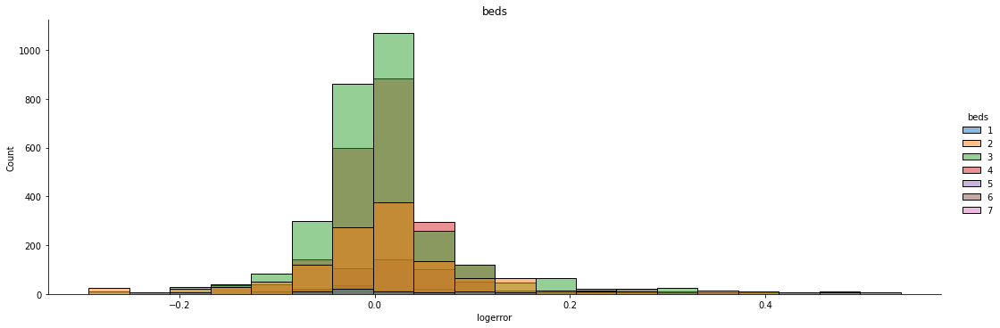

<Figure size 864x576 with 0 Axes>

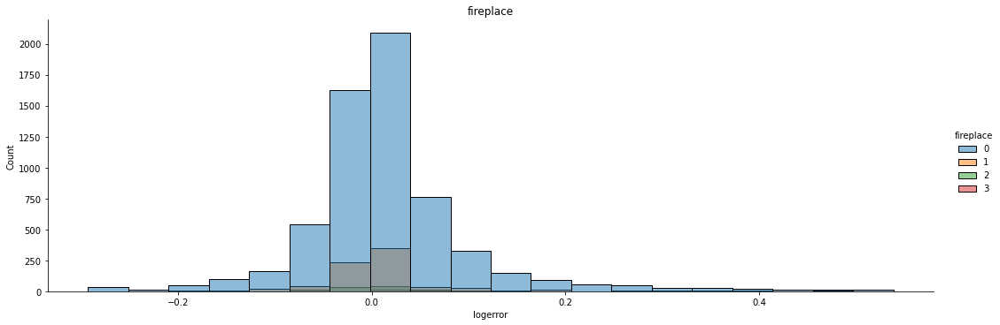

<Figure size 864x576 with 0 Axes>

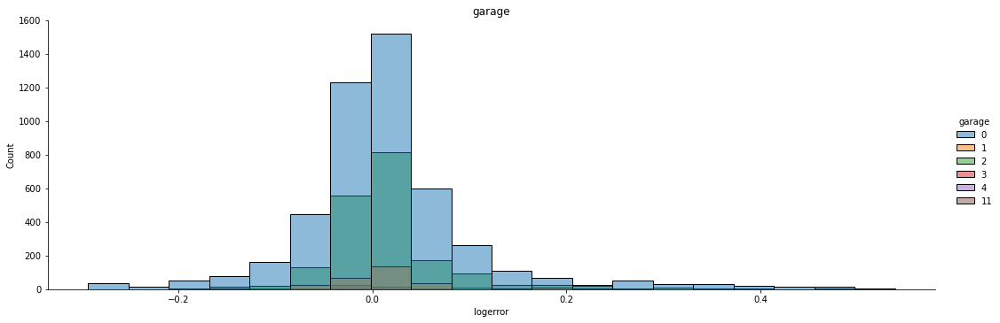

<Figure size 864x576 with 0 Axes>

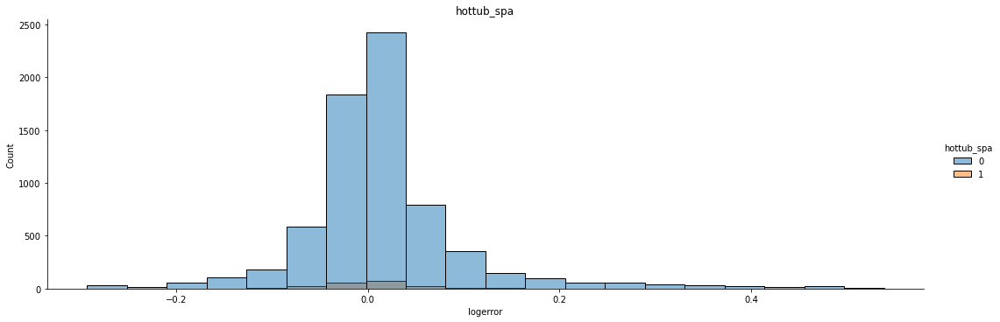

<Figure size 864x576 with 0 Axes>

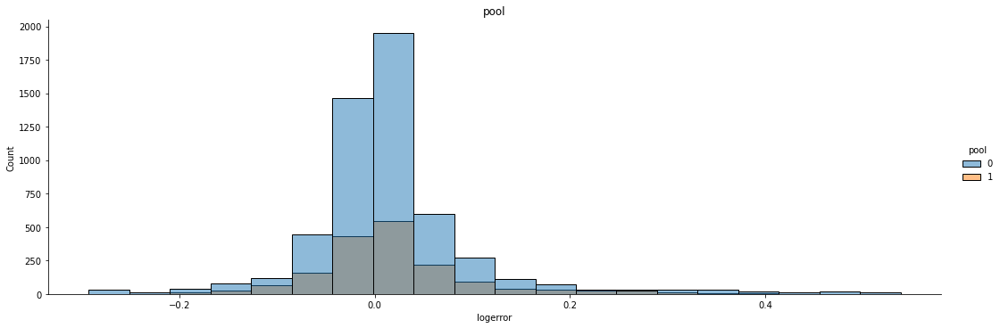

<Figure size 864x576 with 0 Axes>

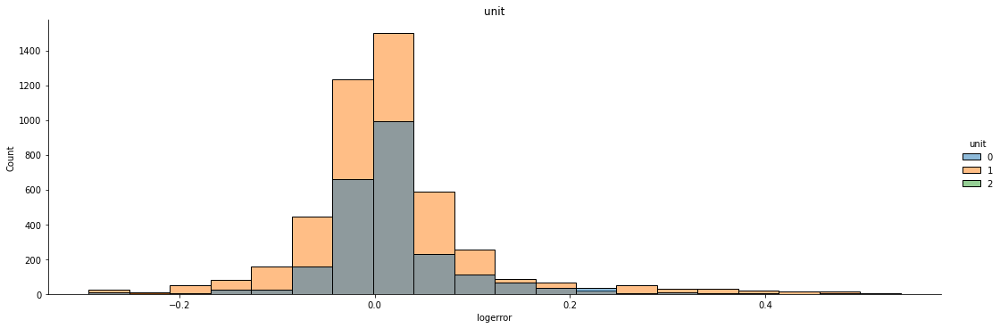

<Figure size 864x576 with 0 Axes>

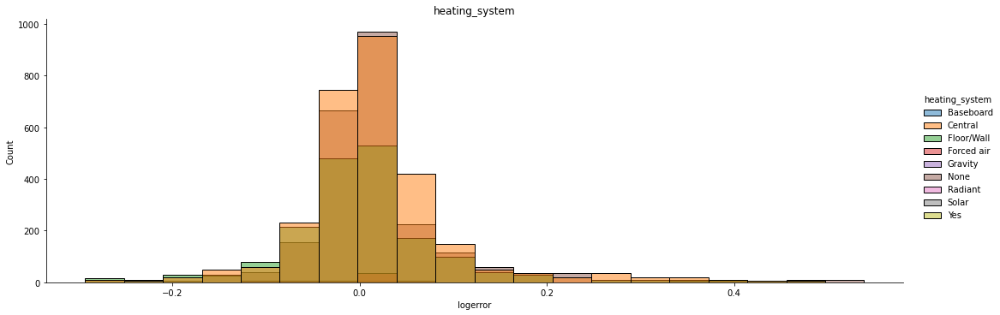

<Figure size 864x576 with 0 Axes>

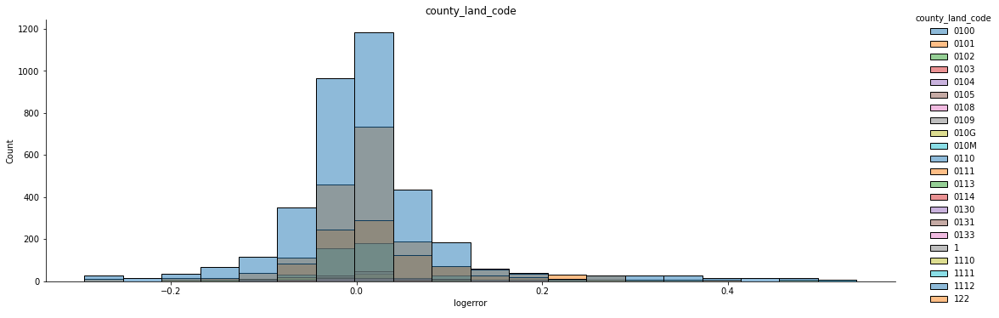

<Figure size 864x576 with 0 Axes>

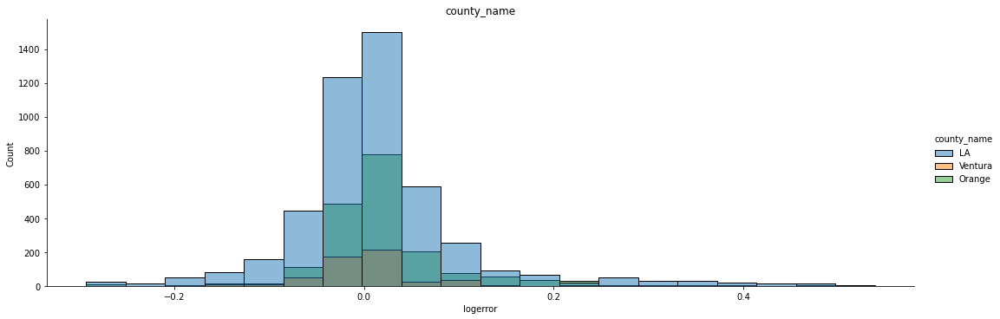

In [89]:
for value in categorical_columns:
    plt.figure(figsize=(12, 8))
    sns.displot(data=sample, x='logerror', bins=20, weights=5, aspect=3, hue=value, palette='tab10')
    plt.title(value)
    plt.show()

In [ ]:
s1 = sample[['logerror', ]]

In [85]:
df = wz.acquire_zillow()

In [87]:
df.regionidzip.nunique()

381

Logerror is more spread:
- ```bath``` = 1 / 8
- ```beds``` = 2
- ```fireplace``` = 0
- ```garage``` = 0 
- ```hottub_spa``` = 0
- ```pool``` all spread
- ```unit``` = 1 / 0 spread 
- ```county_land_code```  all spread
```heating_system``` look for hist with unique values

Logerror is different:
- ```bath``` = 2 / 3 / 1
- ```beds``` = 3 / 1 / 2
- ```fireplace``` = 0 / 3
- ```garage``` = 0 / 2
- ```hottub_spa``` = 0
- ```pool``` = 0
- ```unit``` = 0 / 1
- ```county_land_code```  = 0100 / 1
```heating_system``` almost all values return the same ```logerror```

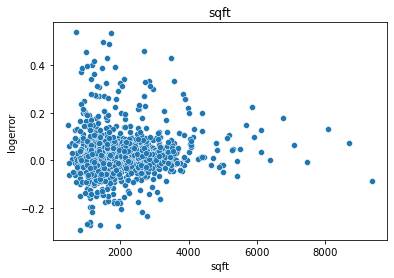

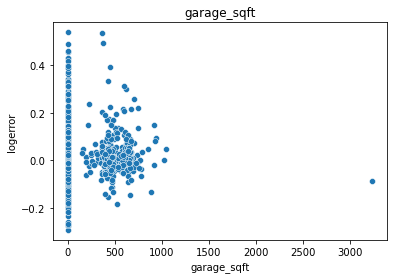

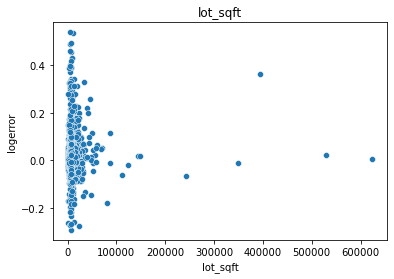

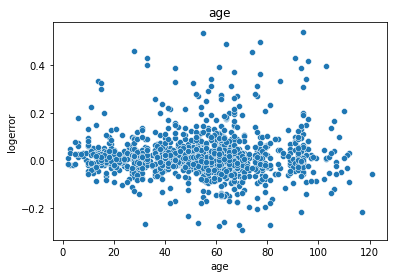

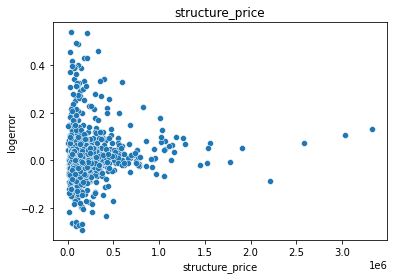

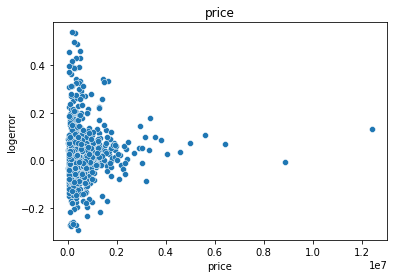

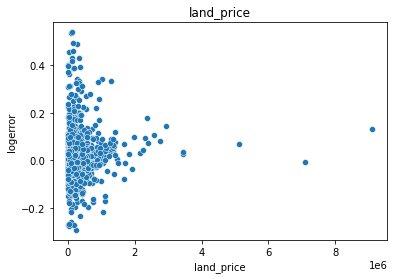

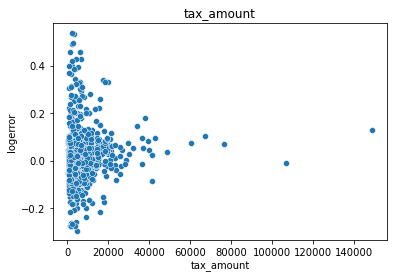

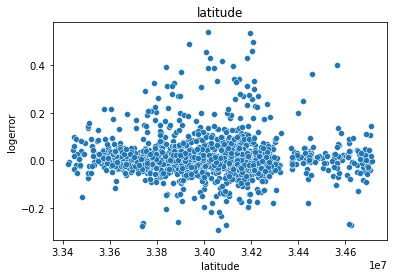

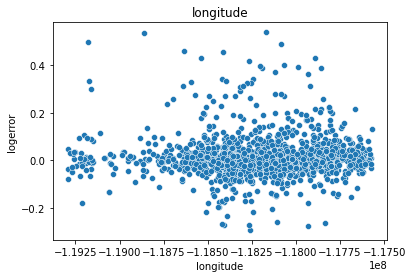

In [91]:
for value in numerical_columns:
    sns.scatterplot(data = sample, x = value, y = 'logerror')
    plt.title(value)
    plt.show()

In [67]:
categorical_columns

['bath',
 'beds',
 'fireplace',
 'garage',
 'hottub_spa',
 'pool',
 'unit',
 'heating_system',
 'county_land_code',
 'county_name']

Bonus:

Compute the mean(logerror) by zipcode and the overall mean(logerror). Write a loop that will run a t-test between the overall mean and the mean for each zip code. We want to identify the zip codes where the error is significantly higher or lower than the expected error.

In [63]:
df1.columns

Index(['id', 'parcelid', 'airconditioningtypeid', 'architecturalstyletypeid',
       'basementsqft', 'bathroomcnt', 'bedroomcnt', 'buildingclasstypeid',
       'buildingqualitytypeid', 'calculatedbathnbr', 'decktypeid',
       'finishedfloor1squarefeet', 'calculatedfinishedsquarefeet',
       'finishedsquarefeet12', 'finishedsquarefeet13', 'finishedsquarefeet15',
       'finishedsquarefeet50', 'finishedsquarefeet6', 'fips', 'fireplacecnt',
       'fullbathcnt', 'garagecarcnt', 'garagetotalsqft', 'hashottuborspa',
       'heatingorsystemtypeid', 'latitude', 'longitude', 'lotsizesquarefeet',
       'poolcnt', 'poolsizesum', 'pooltypeid10', 'pooltypeid2', 'pooltypeid7',
       'propertycountylandusecode', 'propertylandusetypeid',
       'propertyzoningdesc', 'rawcensustractandblock', 'regionidcity',
       'regionidcounty', 'regionidneighborhood', 'regionidzip', 'roomcnt',
       'storytypeid', 'threequarterbathnbr', 'typeconstructiontypeid',
       'unitcnt', 'yardbuildingsqft17', 'yardb

In [92]:
sample['abs_log'] = np.abs(sample.logerror)

In [95]:
sample.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1416 entries, 15062 to 85
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   sqft              1416 non-null   int64   
 1   garage_sqft       1416 non-null   int64   
 2   lot_sqft          1416 non-null   int64   
 3   age               1416 non-null   int64   
 4   structure_price   1416 non-null   int64   
 5   price             1416 non-null   int64   
 6   land_price        1416 non-null   int64   
 7   tax_amount        1416 non-null   float64 
 8   latitude          1416 non-null   int64   
 9   longitude         1416 non-null   int64   
 10  bath              1416 non-null   uint8   
 11  beds              1416 non-null   uint8   
 12  fireplace         1416 non-null   uint8   
 13  garage            1416 non-null   uint8   
 14  hottub_spa        1416 non-null   uint8   
 15  pool              1416 non-null   uint8   
 16  unit              1416

In [10]:
!git status

On branch main
Your branch is ahead of 'origin/main' by 1 commit.
  (use "git push" to publish your local commits)

Changes to be committed:
  (use "git restore --staged <file>..." to unstage)
	new file:   wrangle.py

Changes not staged for commit:
  (use "git add <file>..." to update what will be committed)
  (use "git restore <file>..." to discard changes in working directory)
	modified:   modeling-exercises.ipynb
	modified:   wrangle_zillow.py
	modified:   zillow_wrangle.ipynb

Untracked files:
  (use "git add <file>..." to include in what will be committed)
	Untitled.ipynb
	Untitled1.ipynb
	clean_zillow.csv
	exploration_lesson.ipynb
	explore_zillow_draft.ipynb
	modeling_lesson.ipynb
	wrangle_lesson-0.ipynb
	wrangle_lesson.ipynb
	zillow.csv



In [12]:
!git push

Enumerating objects: 8, done.
Counting objects: 100% (8/8), done.
Delta compression using up to 16 threads
Compressing objects: 100% (6/6), done.
Writing objects: 100% (6/6), 359.63 KiB | 14.38 MiB/s, done.
Total 6 (delta 2), reused 0 (delta 0), pack-reused 0
remote: Resolving deltas: 100% (2/2), completed with 1 local object.
To github.com:nadia-paz/clustering-exercises.git
   6637909..72cd1e5  main -> main


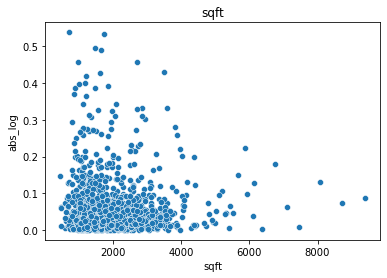

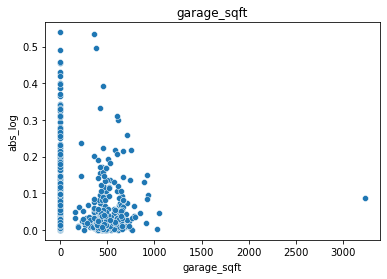

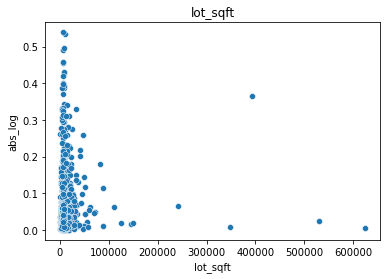

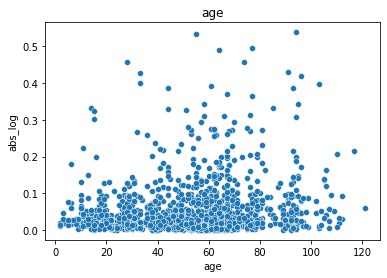

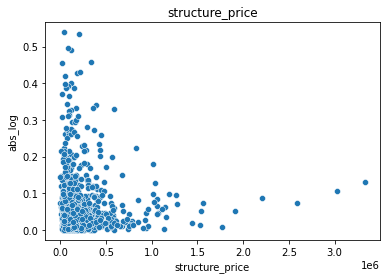

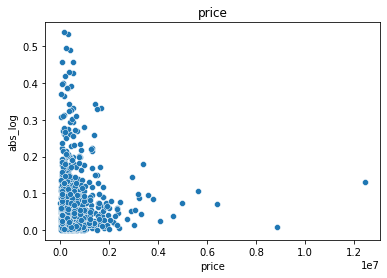

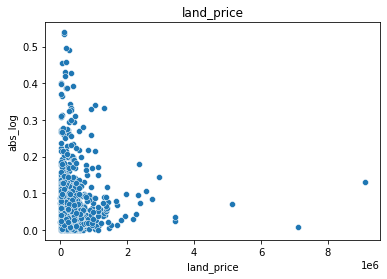

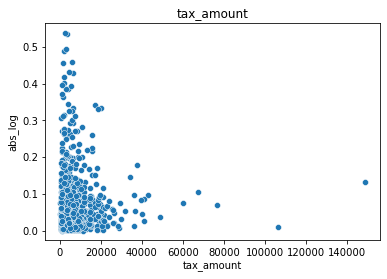

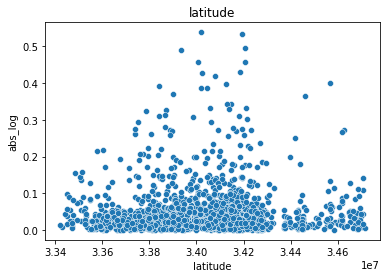

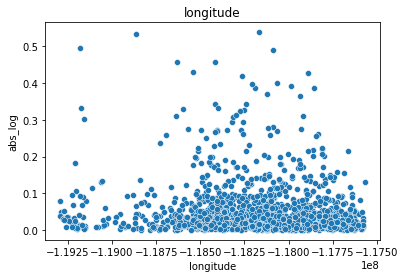

In [96]:
for value in numerical_columns:
    sns.scatterplot(data = sample, x = value, y = 'abs_log')
    plt.title(value)
    plt.show()

In [102]:
log_cols = []
for col in numerical_columns:
    name = 'log_' + col
    log_cols.append(name)
    sample[name] = np.log(sample[col])

In [103]:
sample[log_cols]

,log_sqft,log_garage_sqft,log_lot_sqft,log_age,log_structure_price,log_price,log_land_price,log_tax_amount,log_latitude,log_longitude
15062,7.318,-inf,8.893,3.689,11.924,12.223,10.868,7.931,17.344,NaN
30554,7.251,-inf,8.746,4.205,12.629,13.682,13.253,9.266,17.346,NaN
16673,7.350,-inf,8.125,4.673,12.051,13.578,13.333,9.152,17.345,NaN
846,6.976,5.991,8.475,4.234,10.604,10.751,8.762,6.769,17.349,NaN
4779,6.988,-inf,9.345,4.159,10.626,11.176,10.316,6.933,17.348,NaN
...,...,...,...,...,...,...,...,...,...,...
37302,7.378,-inf,8.838,3.219,11.776,13.211,12.939,8.789,17.344,NaN
22549,7.066,5.991,8.888,4.111,10.711,11.092,9.943,7.188,17.335,NaN
43495,7.272,-inf,8.719,3.689,11.838,12.810,12.335,8.453,17.339,NaN
50665,8.128,-inf,10.273,3.714,13.336,14.661,14.352,10.247,17.345,NaN


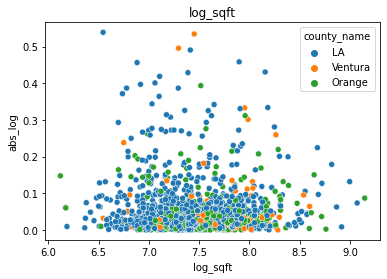

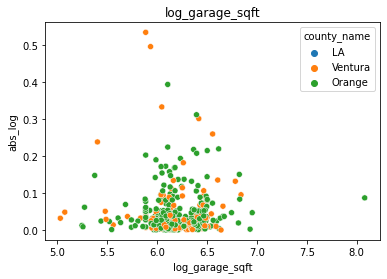

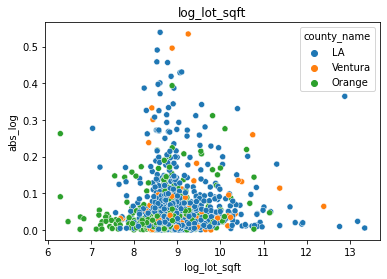

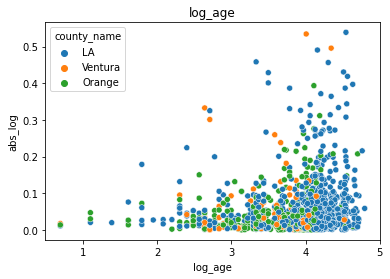

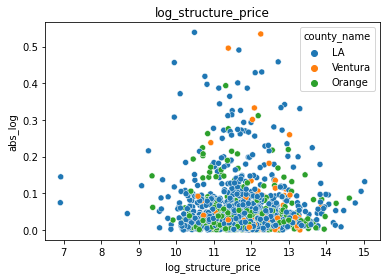

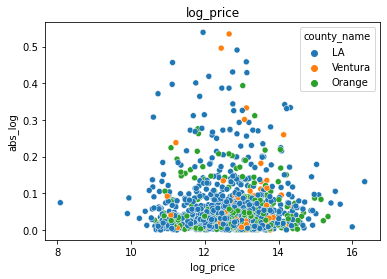

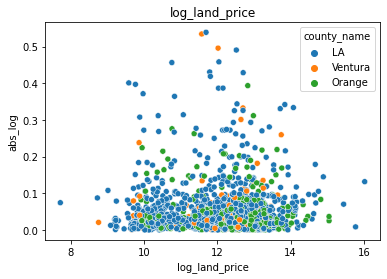

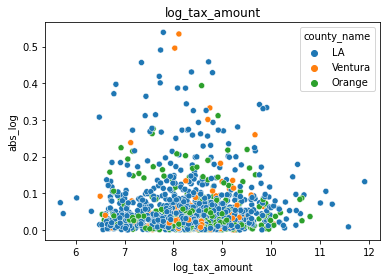

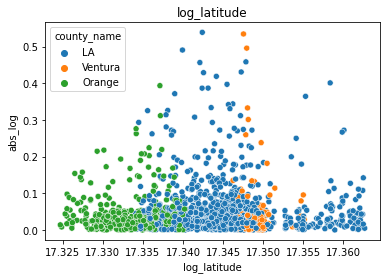

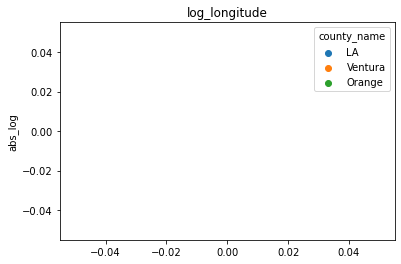

In [105]:
for value in log_cols:
    sns.scatterplot(data=sample, x = value, y = 'abs_log', hue='county_name')
    plt.title(value)
    plt.show()

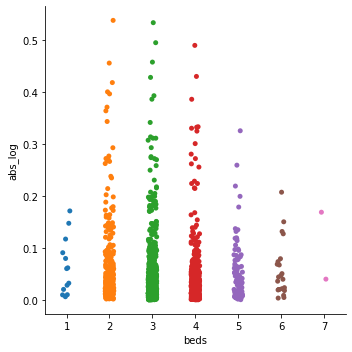

In [107]:
sns.catplot(data=sample, x='beds', y='abs_log');

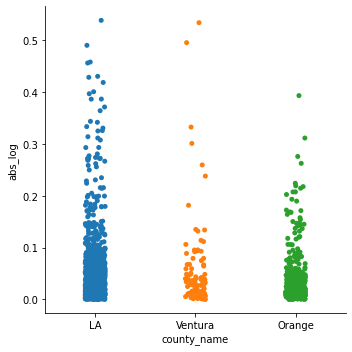

In [109]:
sns.catplot(data=sample, x='county_name', y='abs_log');

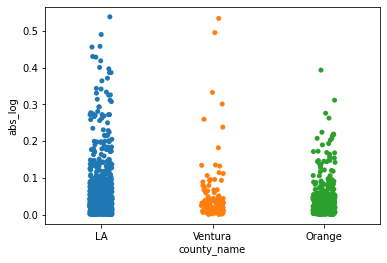

In [111]:
sns.stripplot(data=sample, x='county_name', y='abs_log');

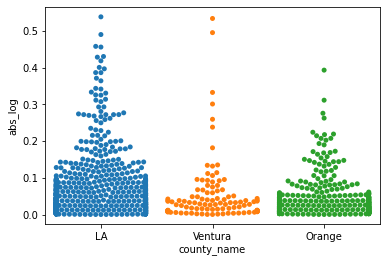

In [110]:
sns.swarmplot(data=sample, x='county_name', y='abs_log');

In [114]:
categorical_columns

['bath',
 'beds',
 'fireplace',
 'garage',
 'hottub_spa',
 'pool',
 'unit',
 'heating_system',
 'county_land_code',
 'county_name']

In [117]:
log_bins = pd.cut?

In [ ]:
log_bins = pd.cut

<Figure size 864x576 with 0 Axes>

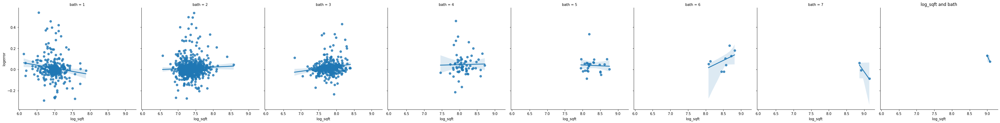

<Figure size 864x576 with 0 Axes>

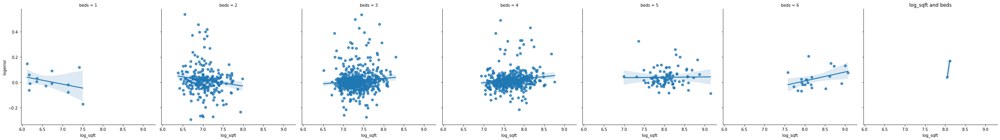

<Figure size 864x576 with 0 Axes>

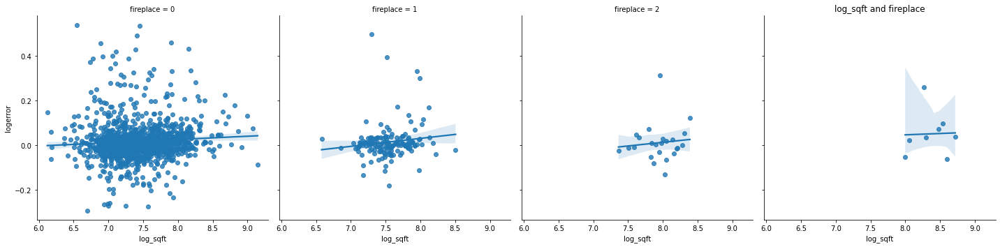

<Figure size 864x576 with 0 Axes>

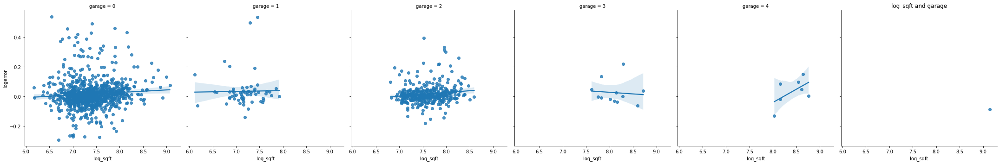

<Figure size 864x576 with 0 Axes>

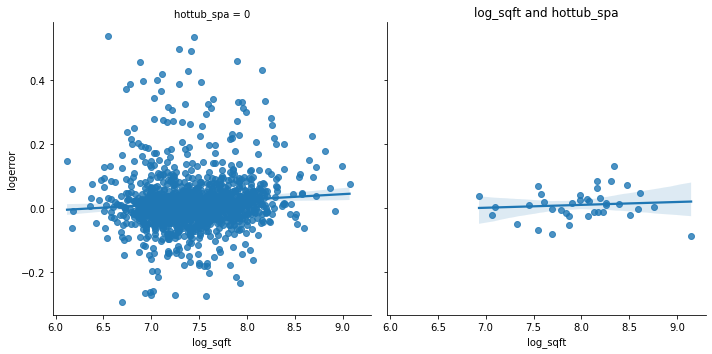

<Figure size 864x576 with 0 Axes>

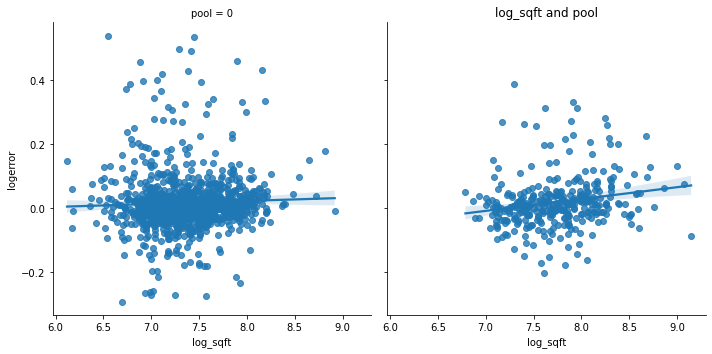

<Figure size 864x576 with 0 Axes>

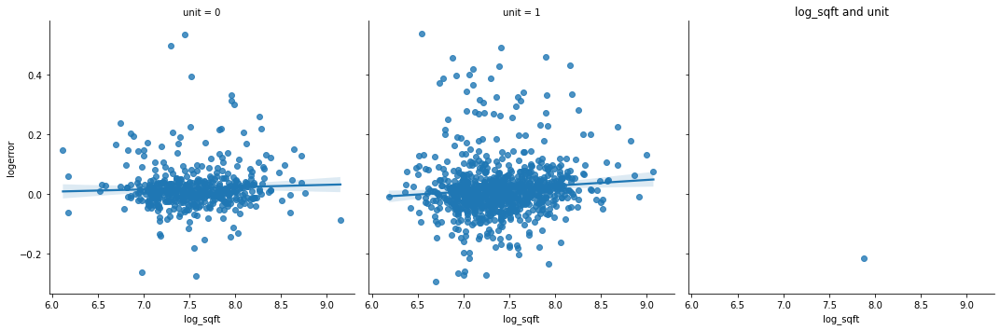

<Figure size 864x576 with 0 Axes>

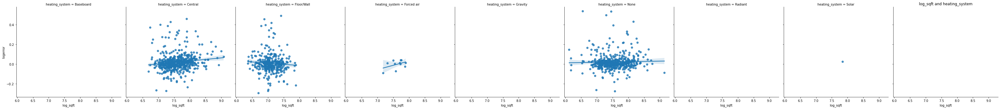

<Figure size 864x576 with 0 Axes>

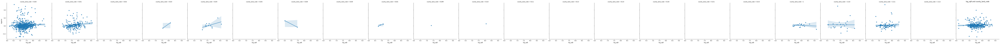

<Figure size 864x576 with 0 Axes>

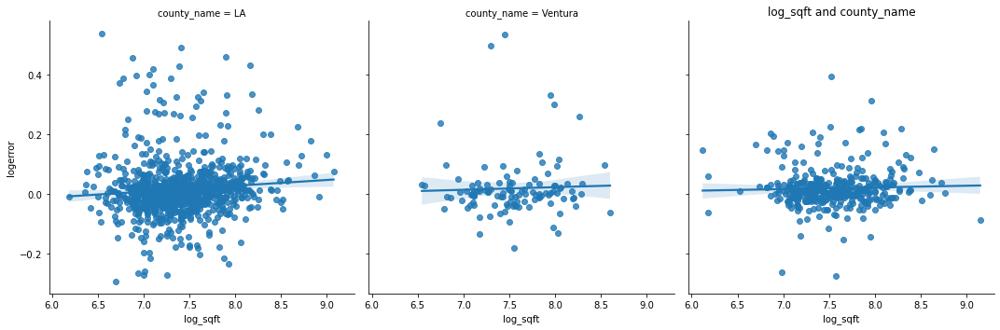

<Figure size 864x576 with 0 Axes>

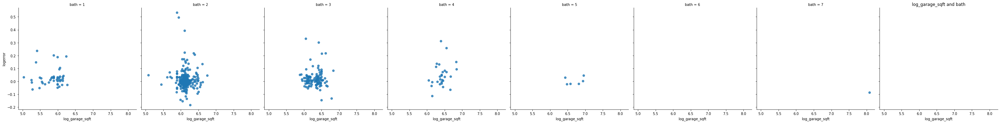

<Figure size 864x576 with 0 Axes>

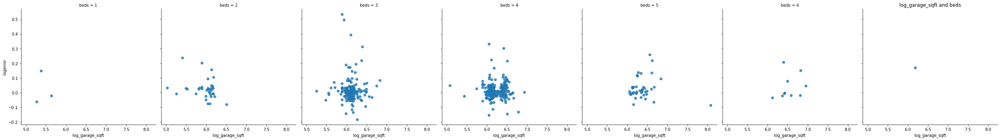

<Figure size 864x576 with 0 Axes>

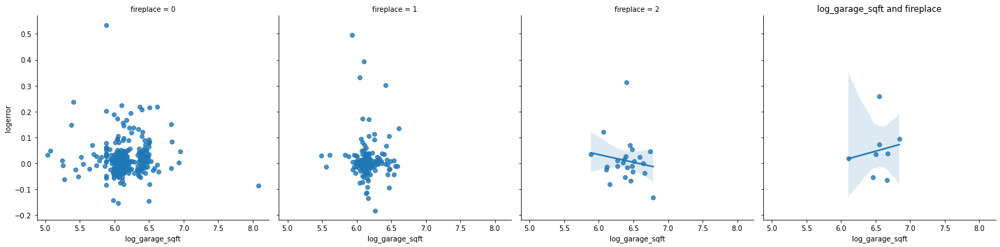

<Figure size 864x576 with 0 Axes>

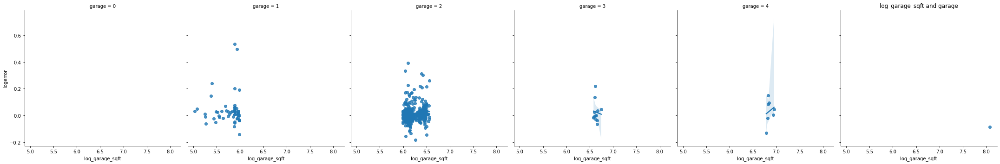

<Figure size 864x576 with 0 Axes>

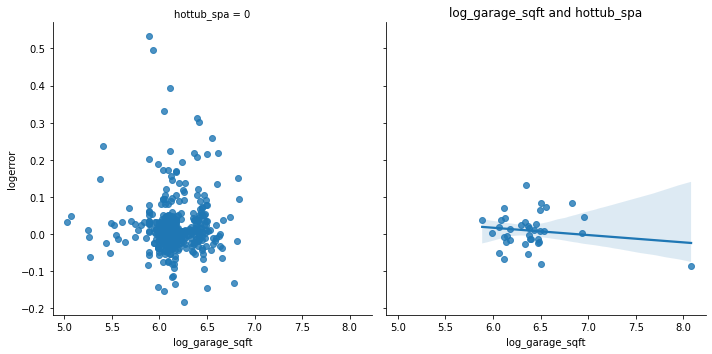

<Figure size 864x576 with 0 Axes>

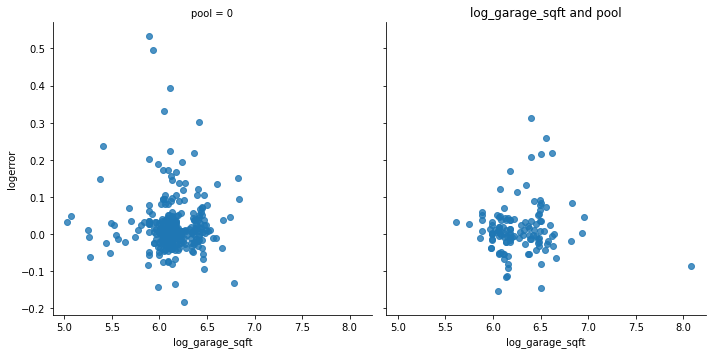

<Figure size 864x576 with 0 Axes>

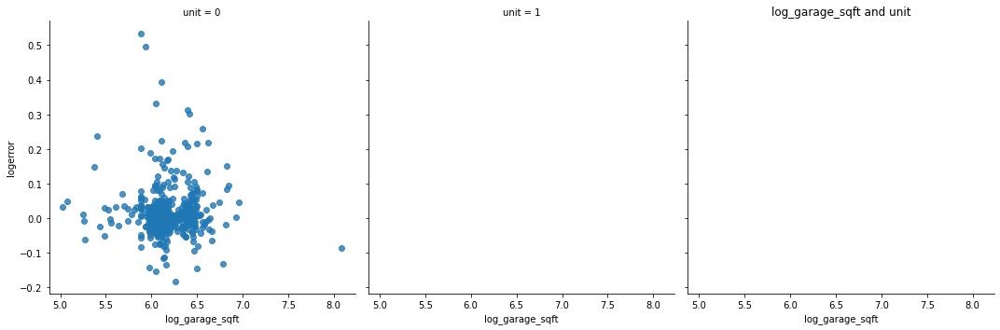

<Figure size 864x576 with 0 Axes>

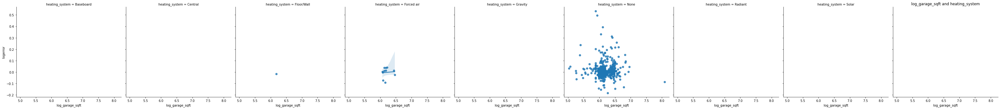

<Figure size 864x576 with 0 Axes>

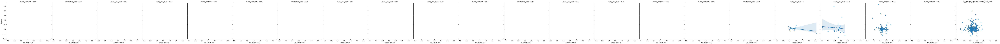

<Figure size 864x576 with 0 Axes>

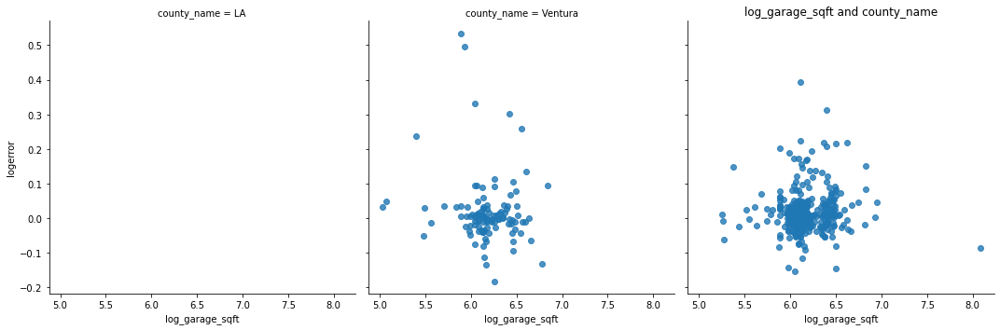

<Figure size 864x576 with 0 Axes>

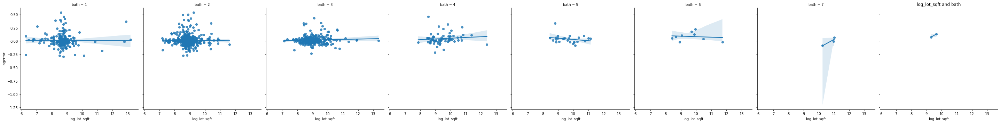

<Figure size 864x576 with 0 Axes>

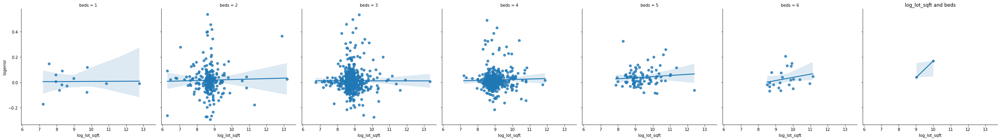

<Figure size 864x576 with 0 Axes>

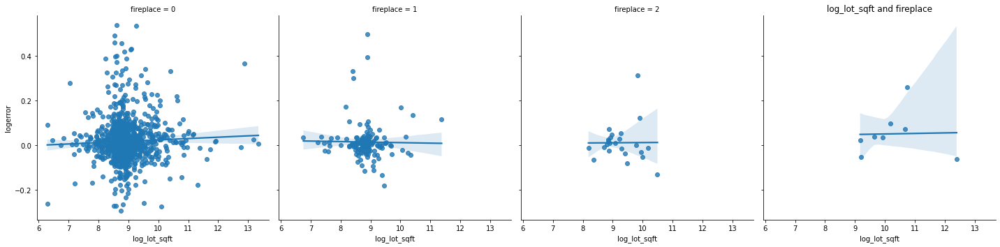

<Figure size 864x576 with 0 Axes>

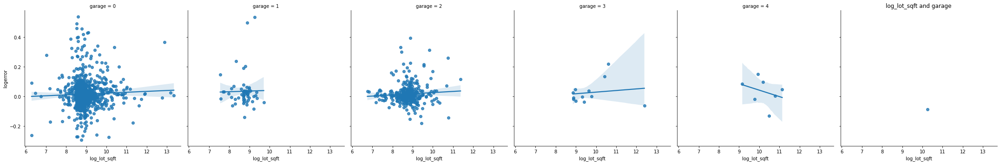

<Figure size 864x576 with 0 Axes>

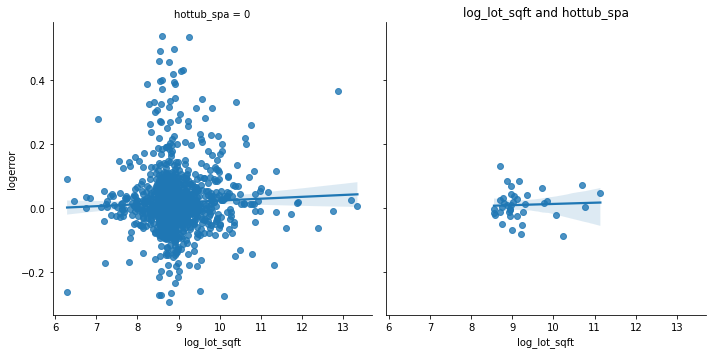

<Figure size 864x576 with 0 Axes>

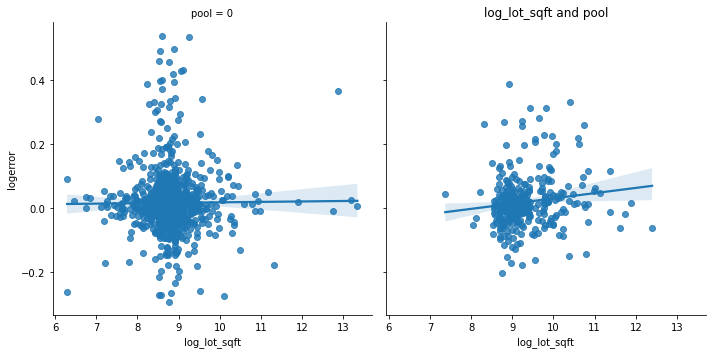

<Figure size 864x576 with 0 Axes>

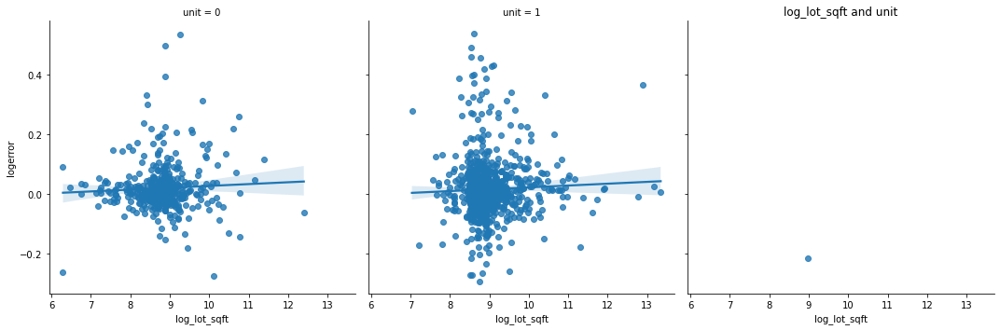

<Figure size 864x576 with 0 Axes>

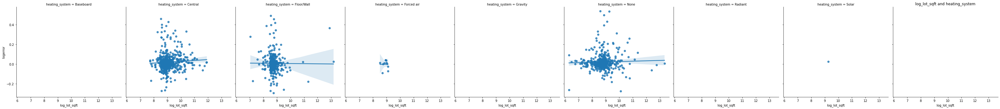

<Figure size 864x576 with 0 Axes>

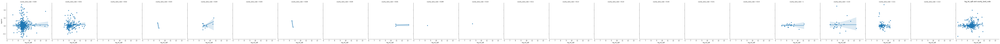

<Figure size 864x576 with 0 Axes>

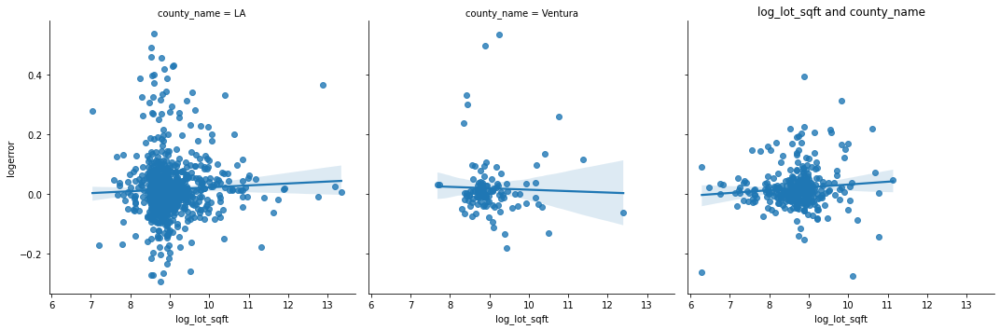

<Figure size 864x576 with 0 Axes>

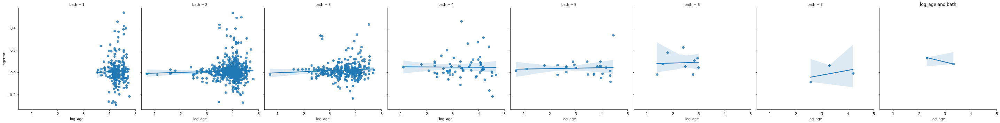

<Figure size 864x576 with 0 Axes>

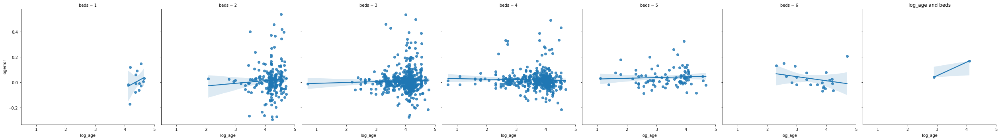

<Figure size 864x576 with 0 Axes>

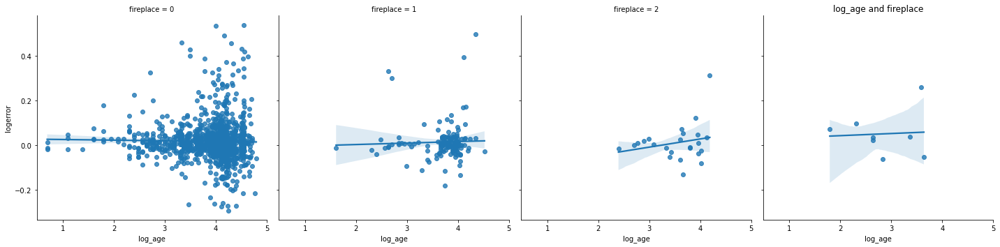

<Figure size 864x576 with 0 Axes>

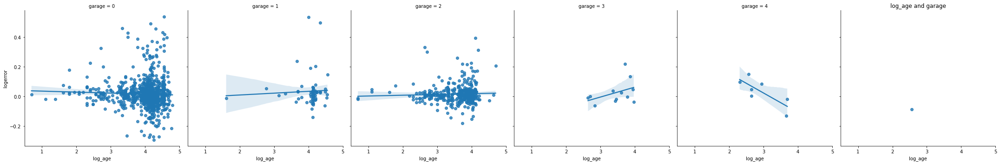

<Figure size 864x576 with 0 Axes>

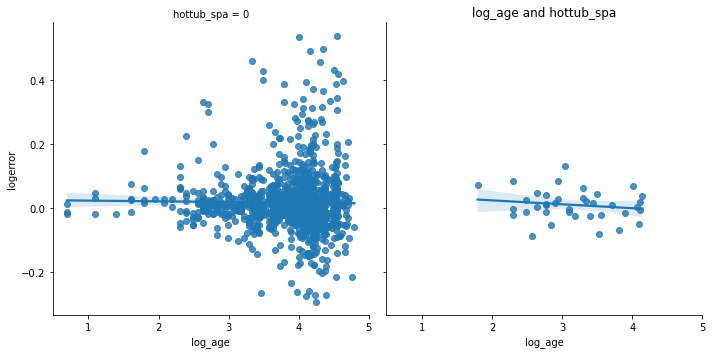

<Figure size 864x576 with 0 Axes>

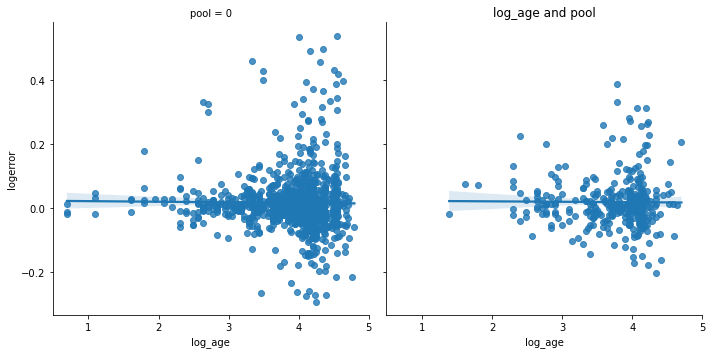

<Figure size 864x576 with 0 Axes>

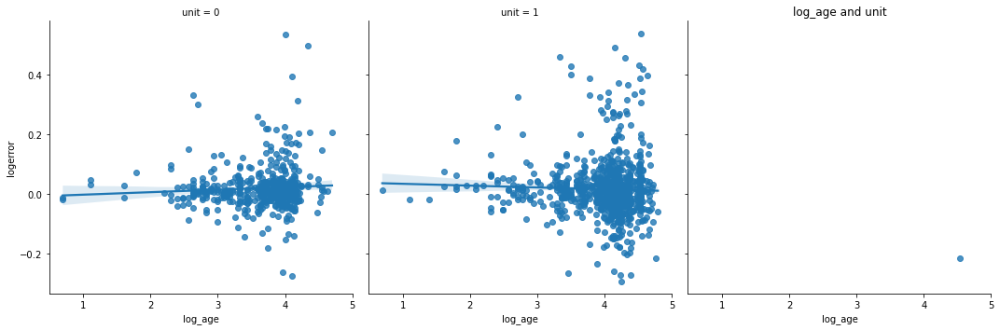

<Figure size 864x576 with 0 Axes>

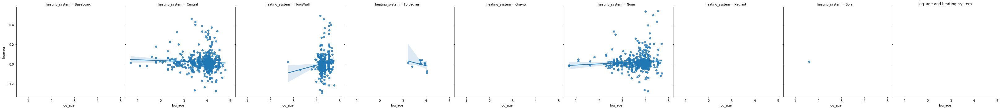

<Figure size 864x576 with 0 Axes>

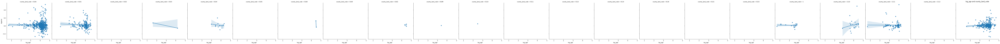

<Figure size 864x576 with 0 Axes>

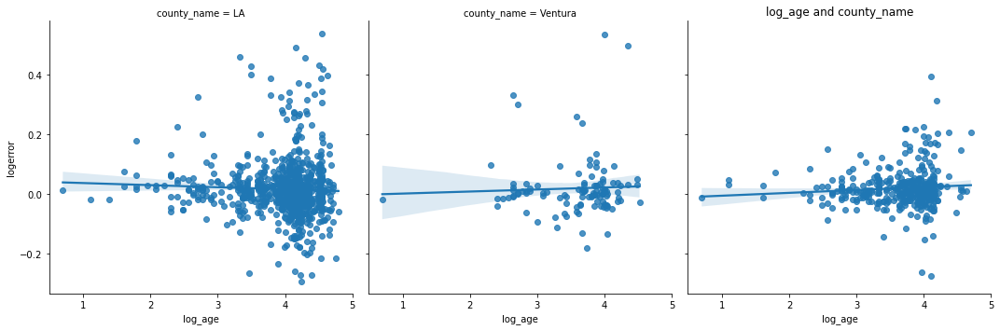

<Figure size 864x576 with 0 Axes>

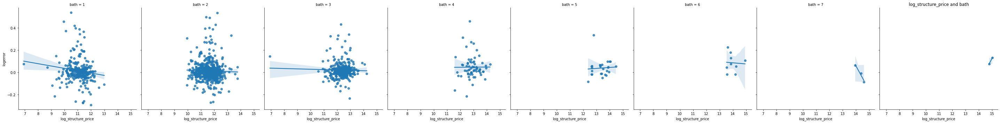

<Figure size 864x576 with 0 Axes>

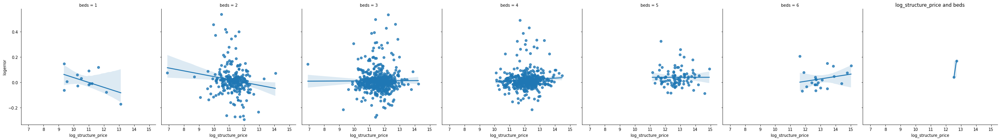

<Figure size 864x576 with 0 Axes>

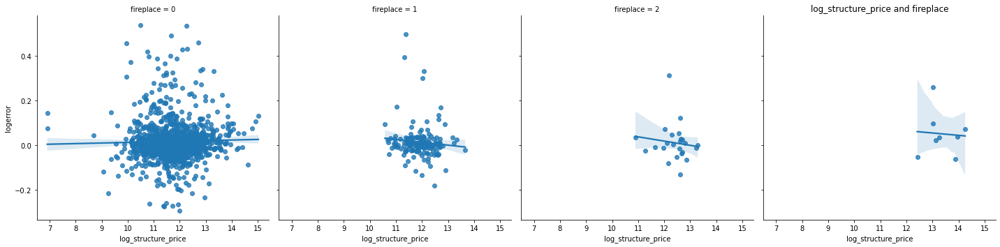

<Figure size 864x576 with 0 Axes>

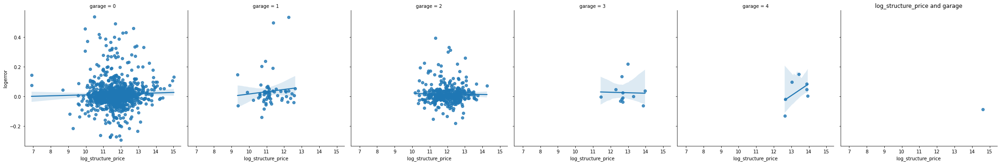

<Figure size 864x576 with 0 Axes>

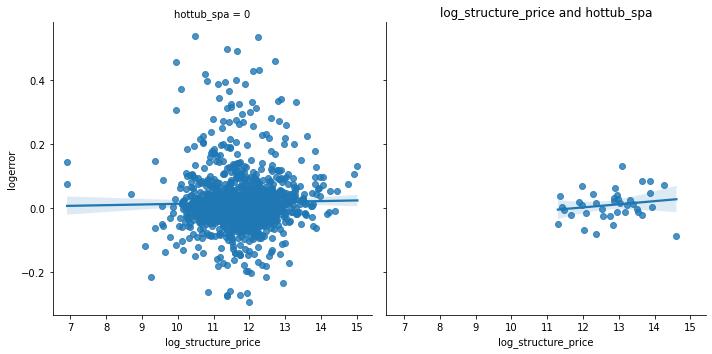

<Figure size 864x576 with 0 Axes>

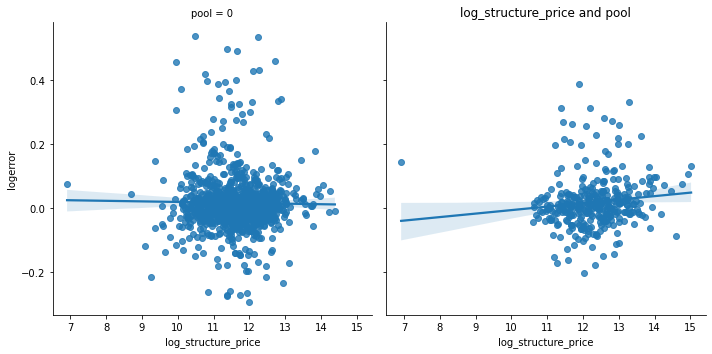

<Figure size 864x576 with 0 Axes>

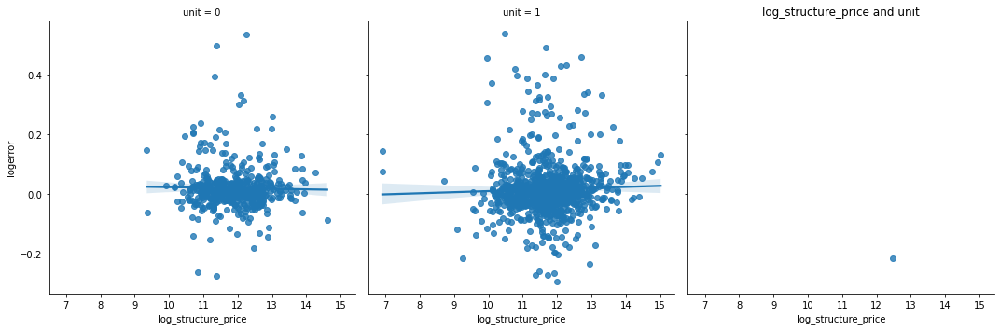

<Figure size 864x576 with 0 Axes>

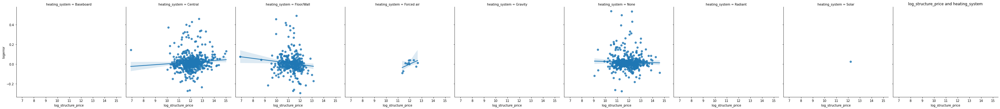

<Figure size 864x576 with 0 Axes>

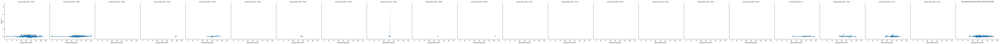

<Figure size 864x576 with 0 Axes>

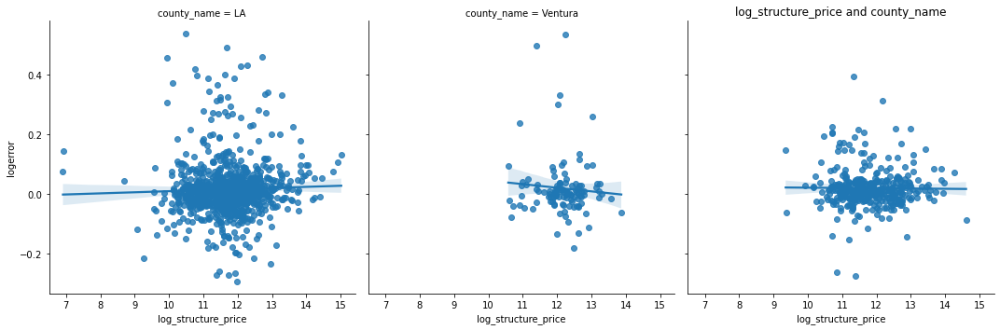

<Figure size 864x576 with 0 Axes>

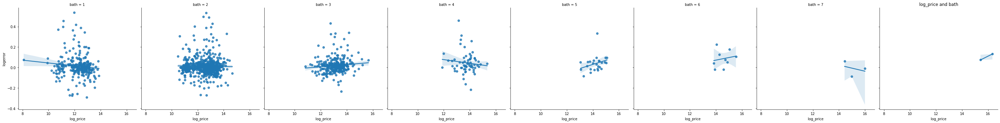

<Figure size 864x576 with 0 Axes>

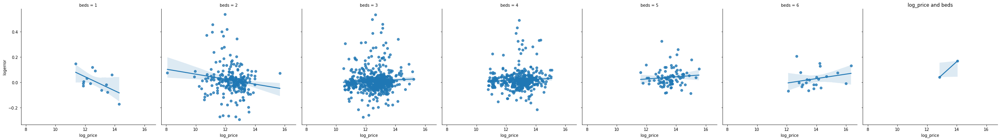

<Figure size 864x576 with 0 Axes>

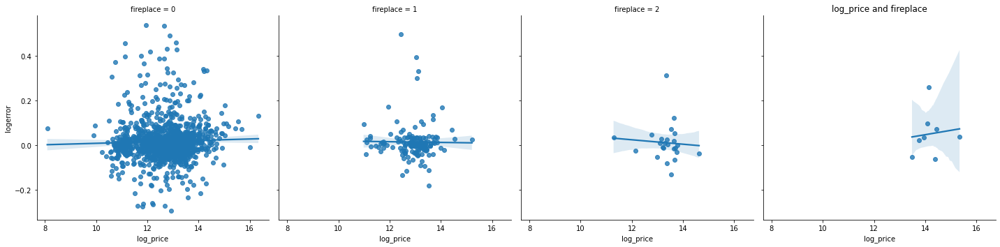

<Figure size 864x576 with 0 Axes>

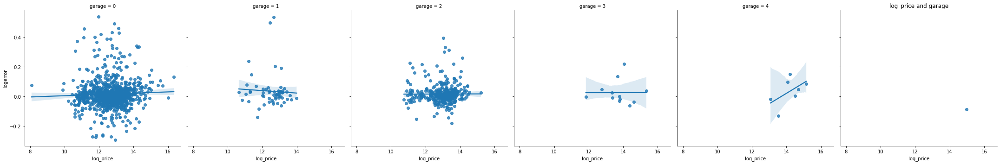

<Figure size 864x576 with 0 Axes>

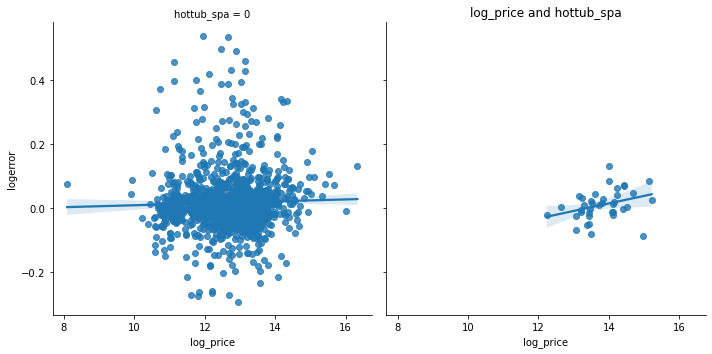

<Figure size 864x576 with 0 Axes>

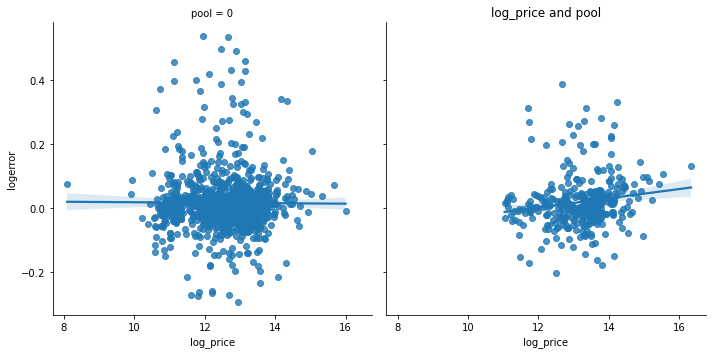

<Figure size 864x576 with 0 Axes>

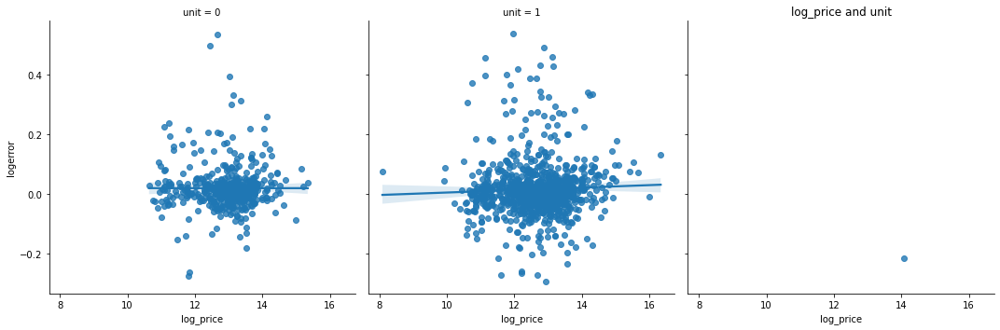

<Figure size 864x576 with 0 Axes>

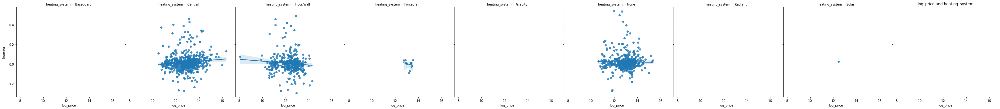

<Figure size 864x576 with 0 Axes>

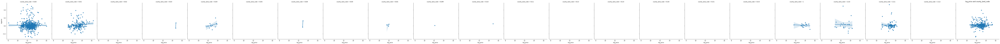

<Figure size 864x576 with 0 Axes>

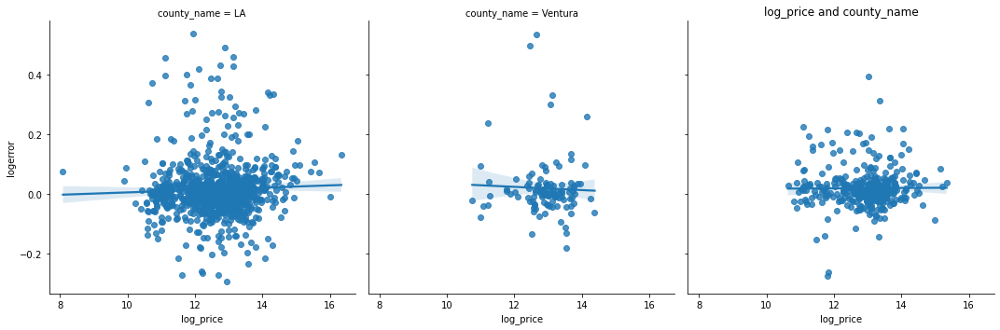

<Figure size 864x576 with 0 Axes>

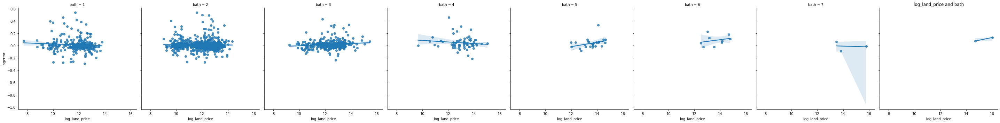

<Figure size 864x576 with 0 Axes>

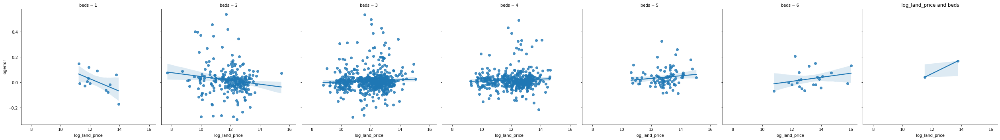

<Figure size 864x576 with 0 Axes>

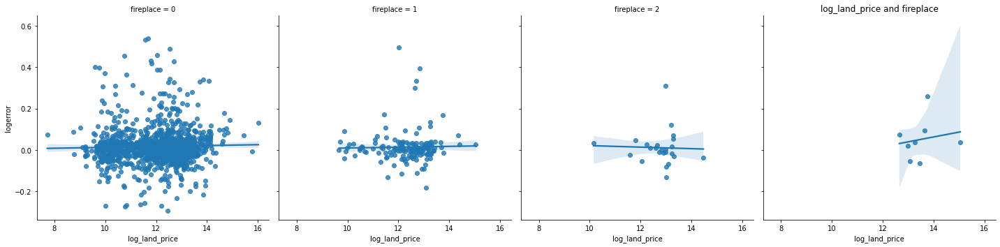

<Figure size 864x576 with 0 Axes>

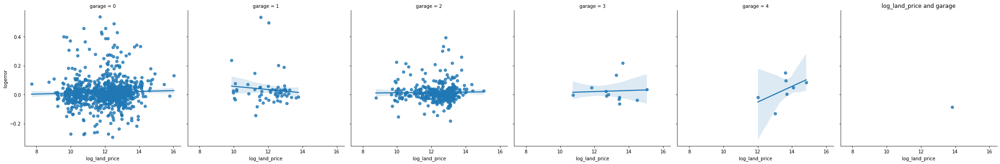

<Figure size 864x576 with 0 Axes>

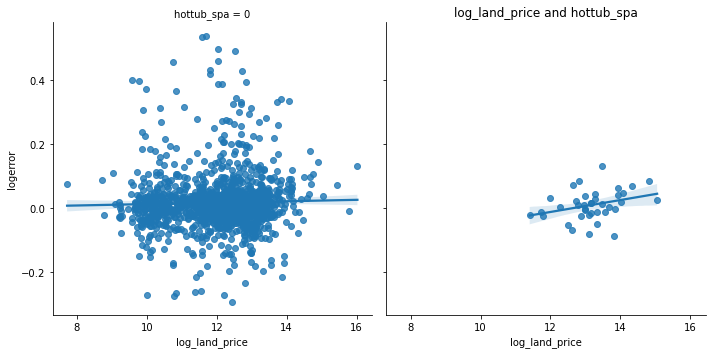

<Figure size 864x576 with 0 Axes>

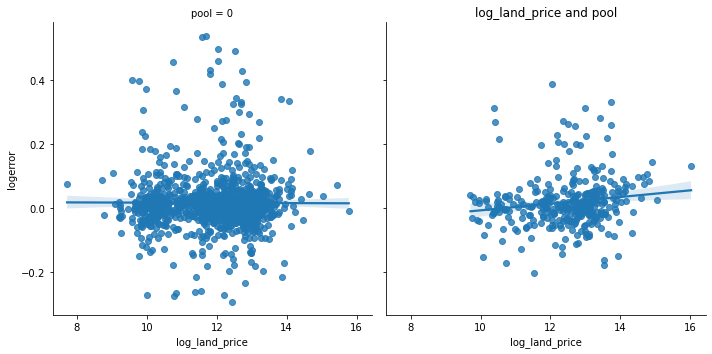

<Figure size 864x576 with 0 Axes>

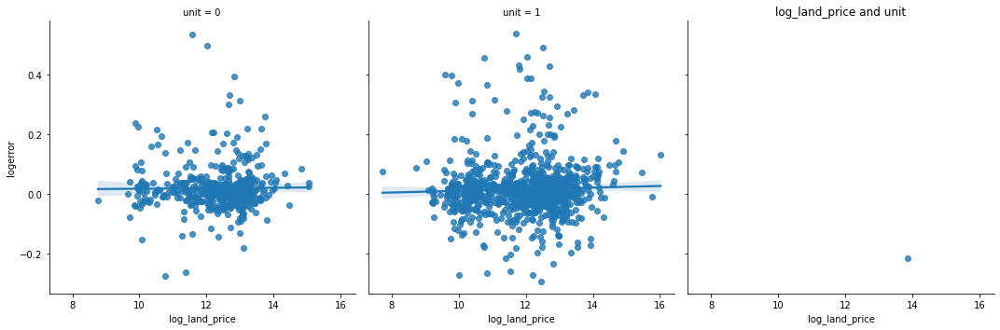

<Figure size 864x576 with 0 Axes>

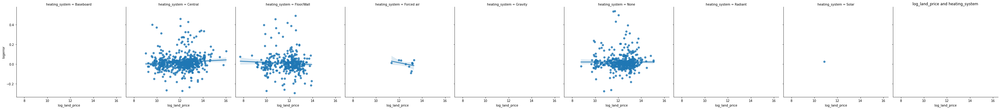

<Figure size 864x576 with 0 Axes>

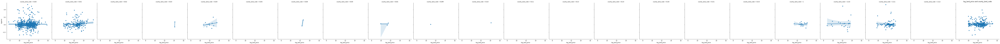

<Figure size 864x576 with 0 Axes>

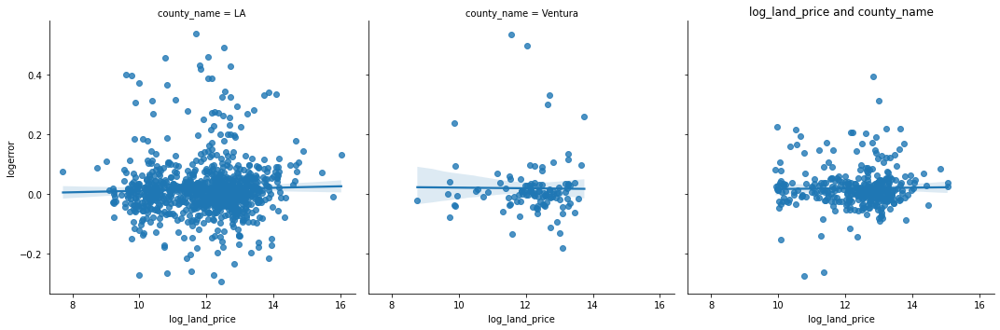

<Figure size 864x576 with 0 Axes>

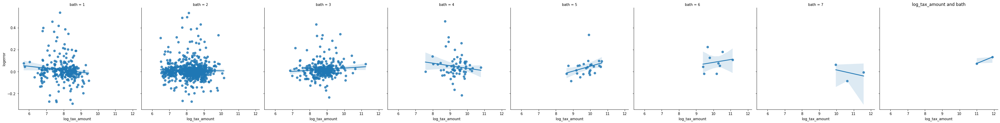

<Figure size 864x576 with 0 Axes>

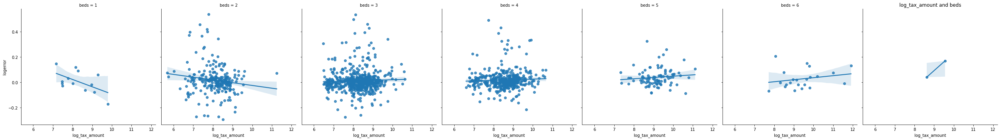

<Figure size 864x576 with 0 Axes>

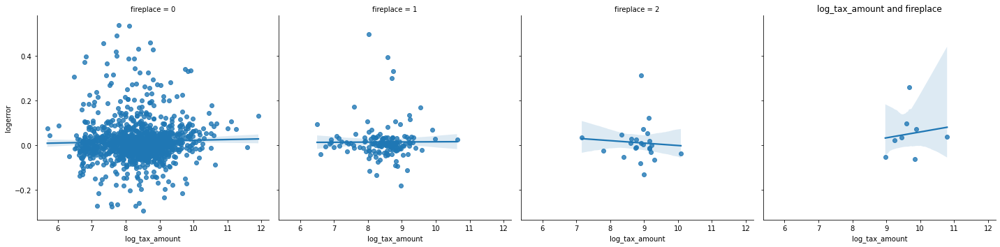

<Figure size 864x576 with 0 Axes>

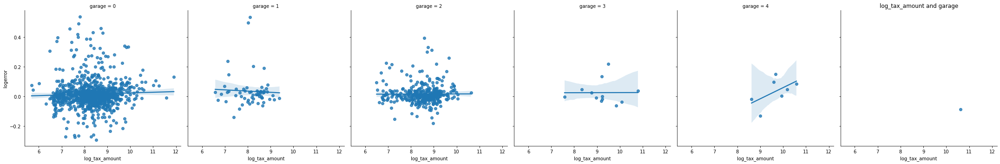

<Figure size 864x576 with 0 Axes>

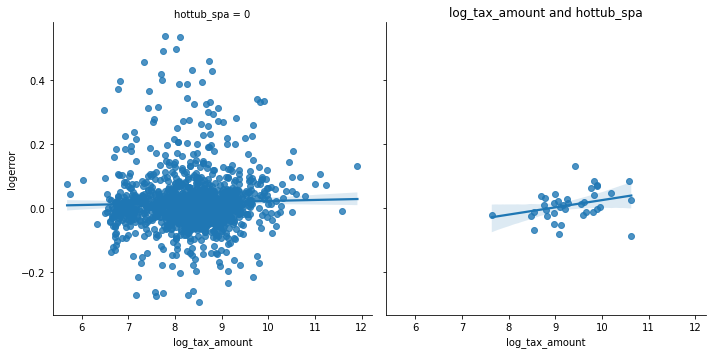

<Figure size 864x576 with 0 Axes>

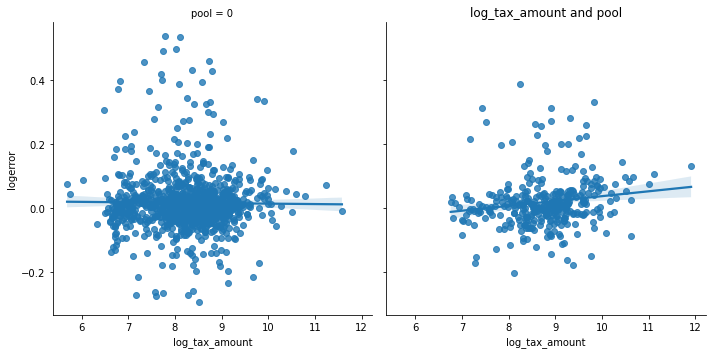

<Figure size 864x576 with 0 Axes>

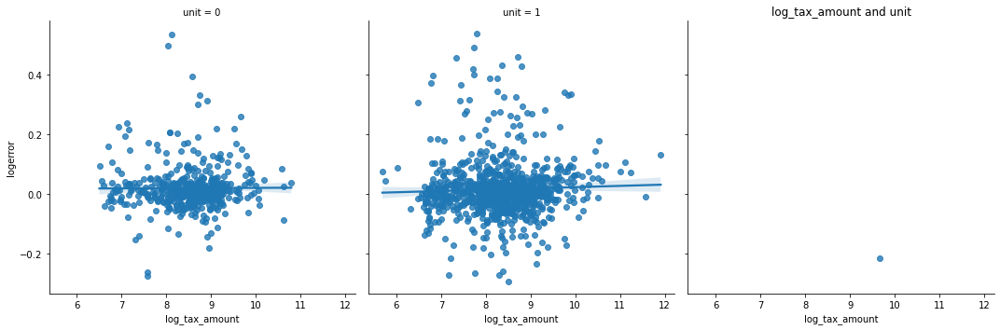

<Figure size 864x576 with 0 Axes>

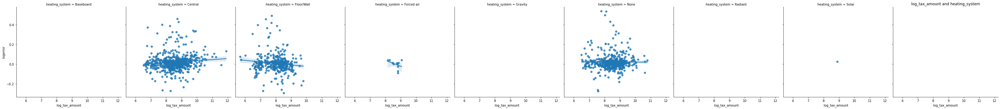

<Figure size 864x576 with 0 Axes>

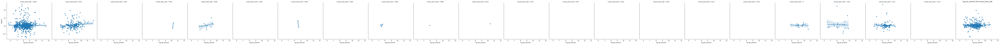

<Figure size 864x576 with 0 Axes>

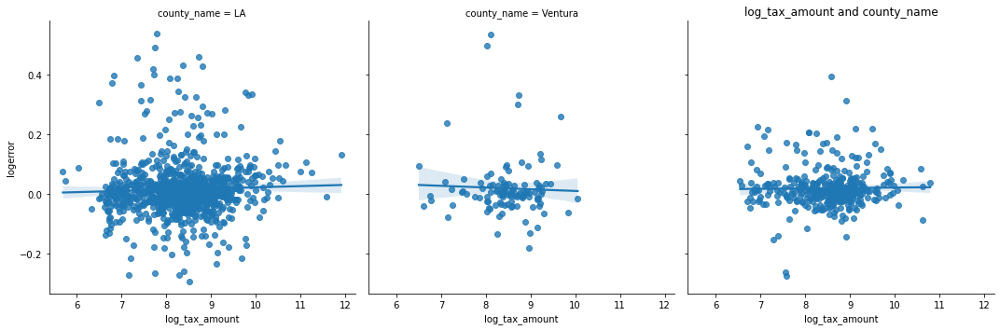

<Figure size 864x576 with 0 Axes>

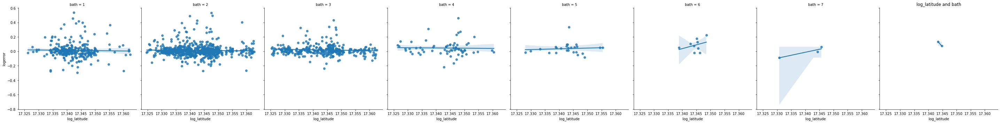

<Figure size 864x576 with 0 Axes>

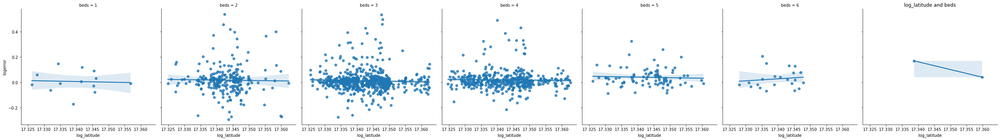

<Figure size 864x576 with 0 Axes>

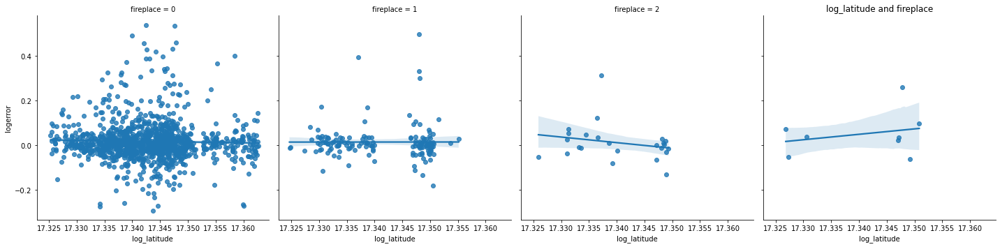

<Figure size 864x576 with 0 Axes>

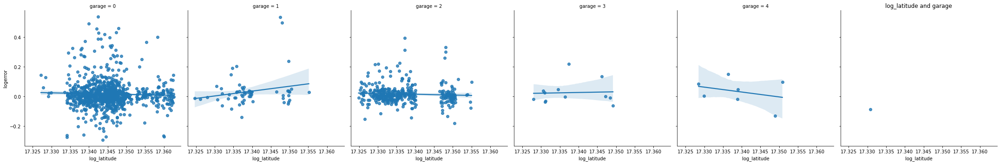

<Figure size 864x576 with 0 Axes>

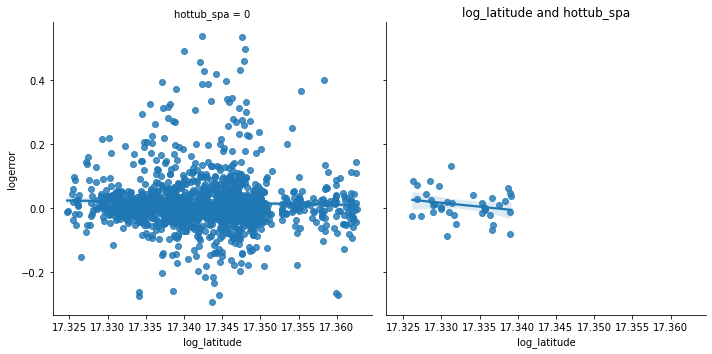

<Figure size 864x576 with 0 Axes>

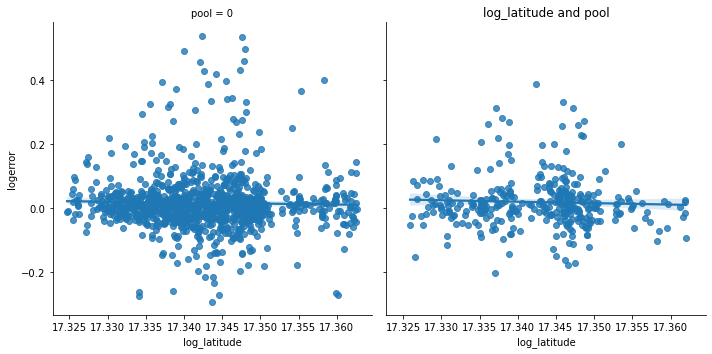

<Figure size 864x576 with 0 Axes>

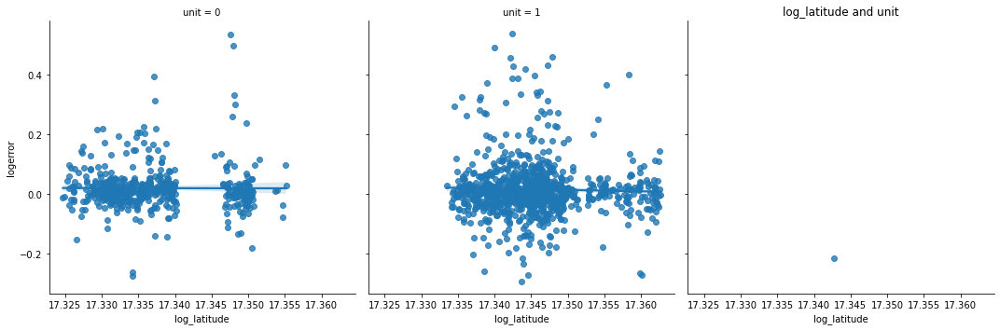

<Figure size 864x576 with 0 Axes>

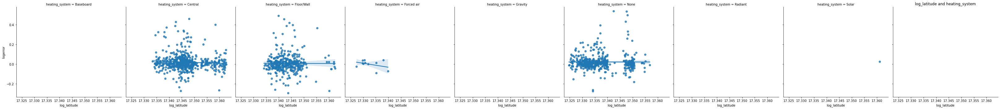

<Figure size 864x576 with 0 Axes>

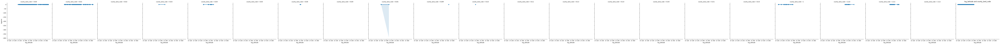

<Figure size 864x576 with 0 Axes>

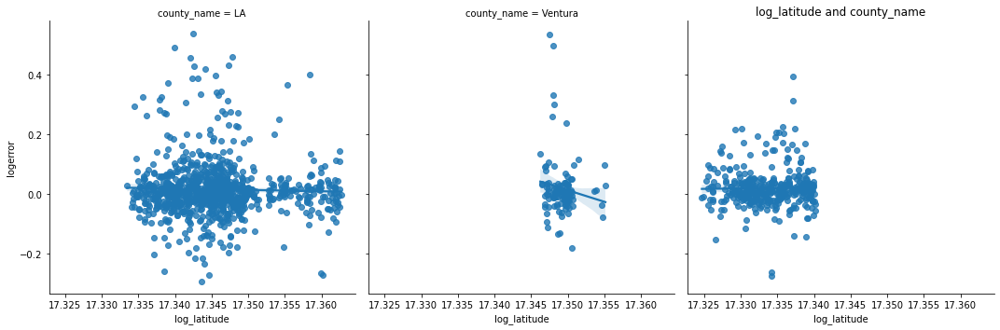

<Figure size 864x576 with 0 Axes>

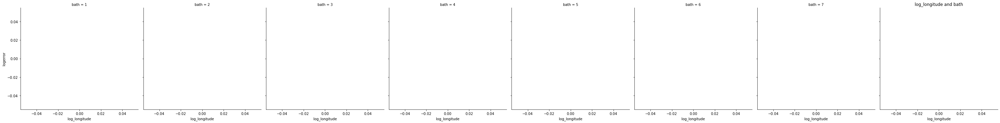

<Figure size 864x576 with 0 Axes>

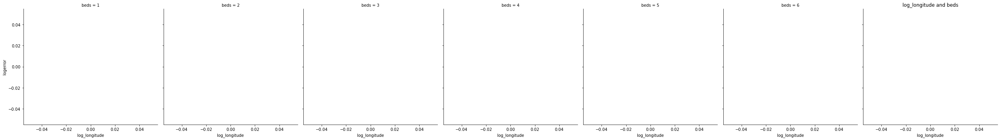

<Figure size 864x576 with 0 Axes>

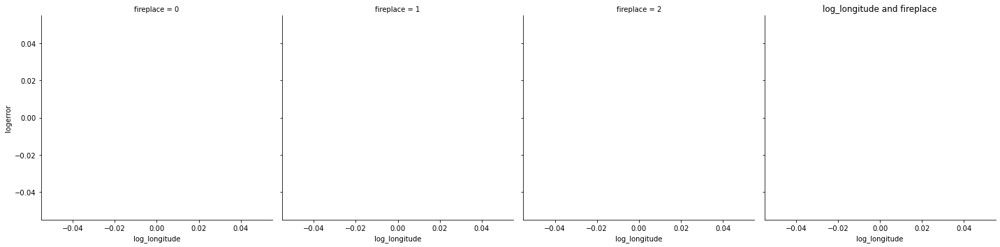

<Figure size 864x576 with 0 Axes>

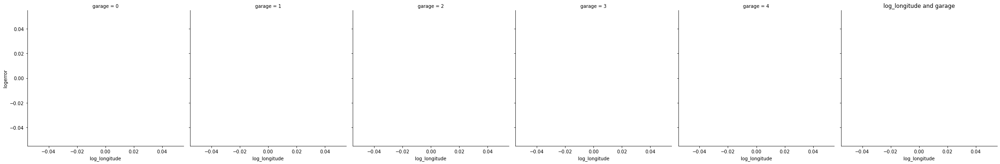

<Figure size 864x576 with 0 Axes>

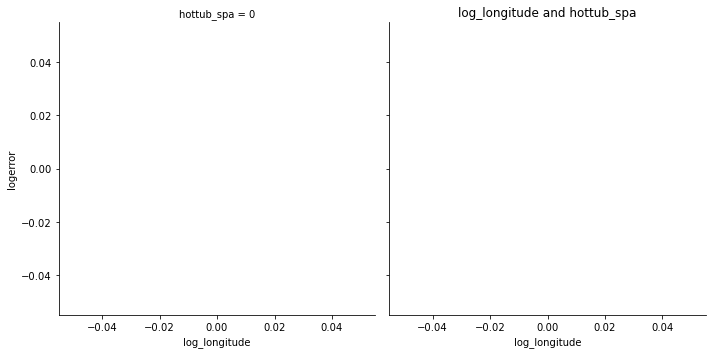

<Figure size 864x576 with 0 Axes>

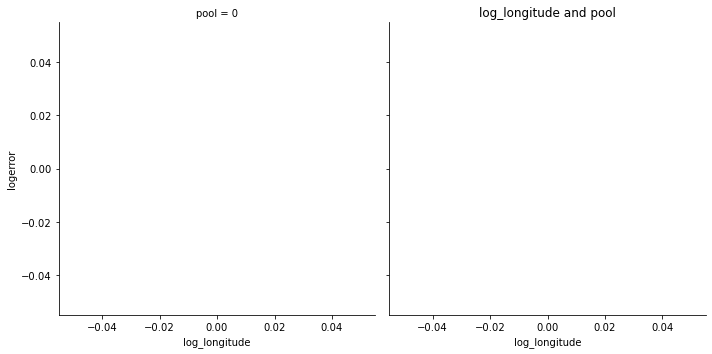

<Figure size 864x576 with 0 Axes>

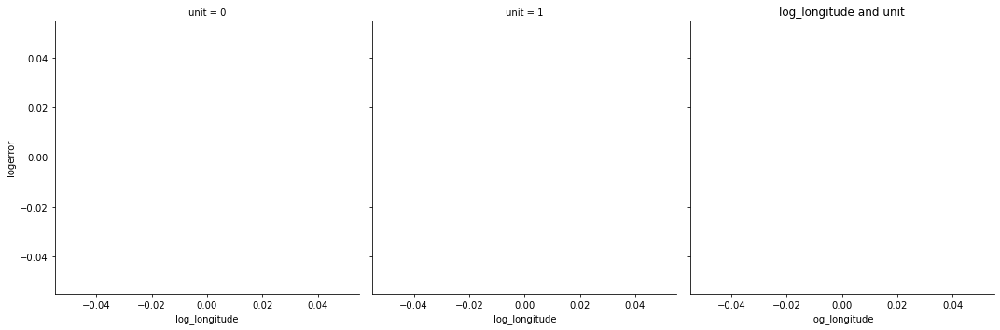

<Figure size 864x576 with 0 Axes>

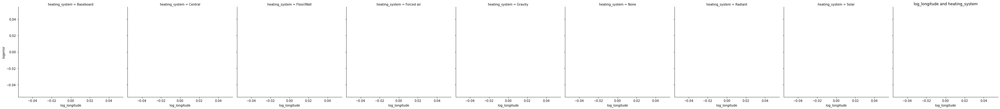

<Figure size 864x576 with 0 Axes>

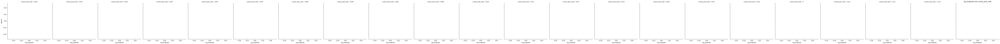

<Figure size 864x576 with 0 Axes>

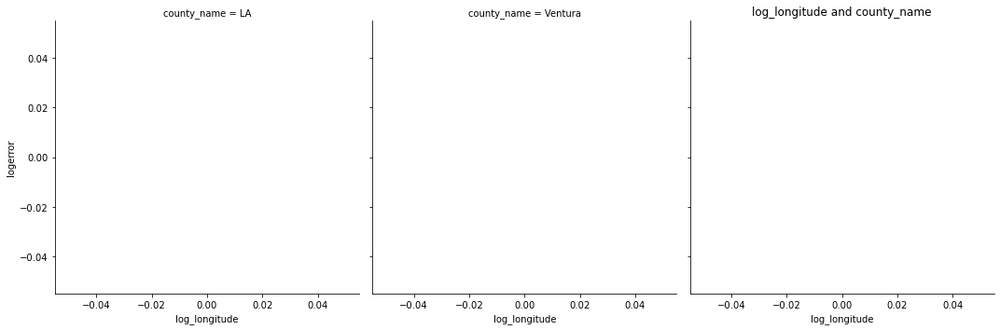

In [125]:
for num in log_cols:
    for cat in categorical_columns:
        plt.figure(figsize=(12, 8))
        sns.lmplot(data=sample, x=num, y='logerror', col=cat)
        plt.title(num + ' and ' + cat)
        plt.show()

<Figure size 864x576 with 0 Axes>

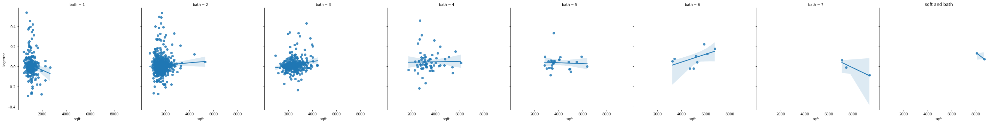

<Figure size 864x576 with 0 Axes>

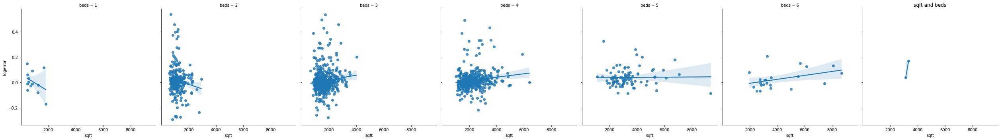

<Figure size 864x576 with 0 Axes>

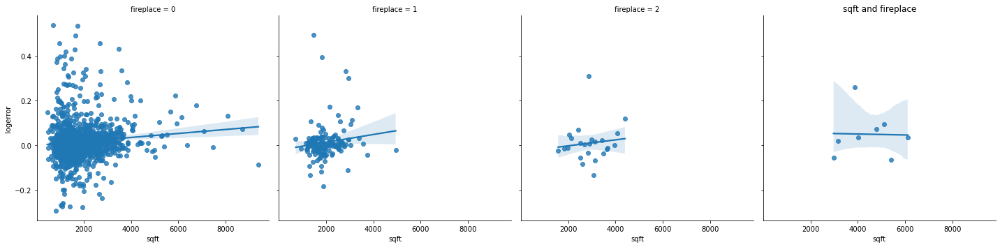

<Figure size 864x576 with 0 Axes>

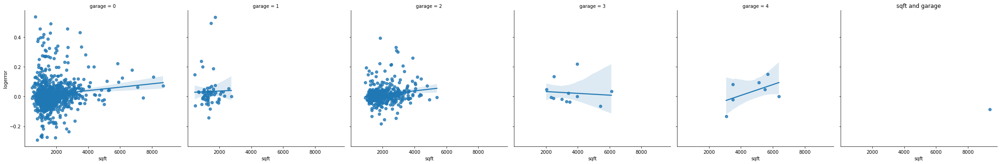

<Figure size 864x576 with 0 Axes>

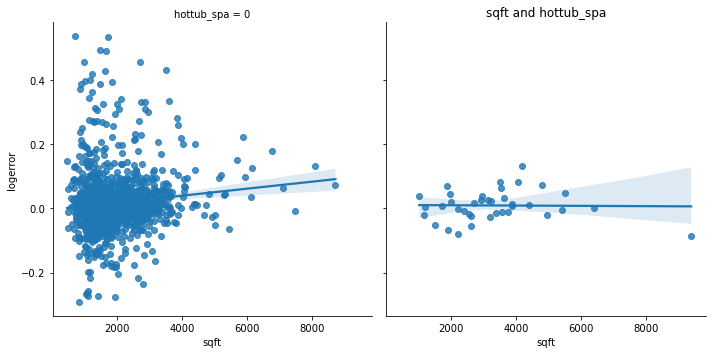

<Figure size 864x576 with 0 Axes>

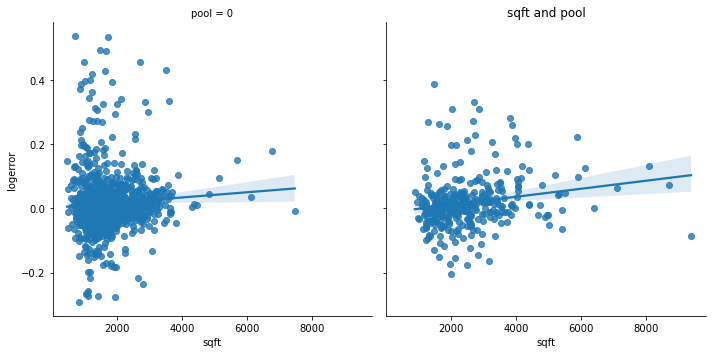

<Figure size 864x576 with 0 Axes>

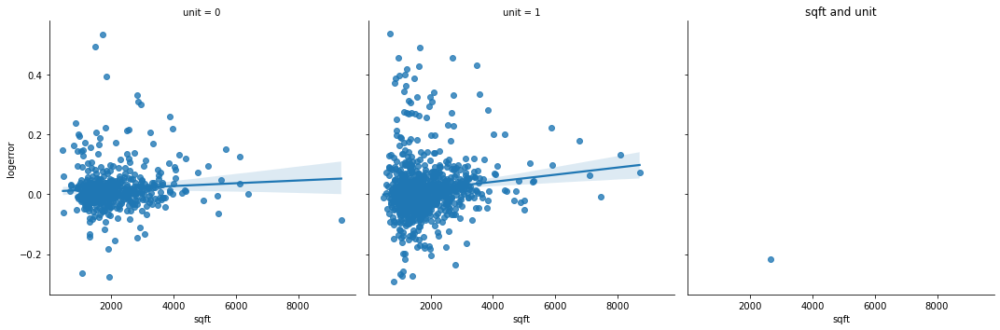

<Figure size 864x576 with 0 Axes>

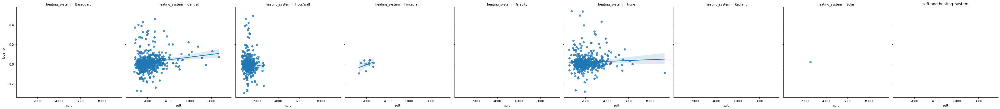

<Figure size 864x576 with 0 Axes>

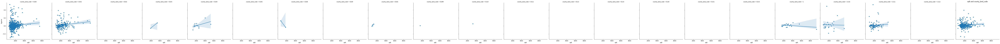

<Figure size 864x576 with 0 Axes>

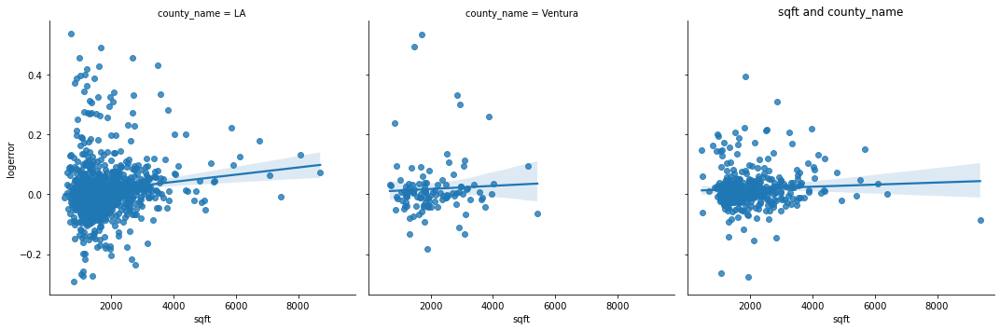

<Figure size 864x576 with 0 Axes>

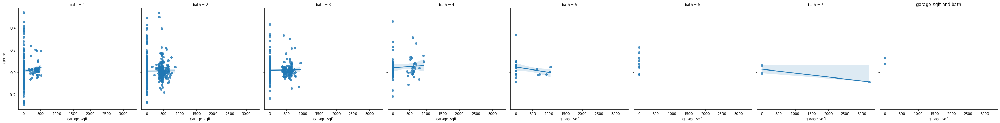

<Figure size 864x576 with 0 Axes>

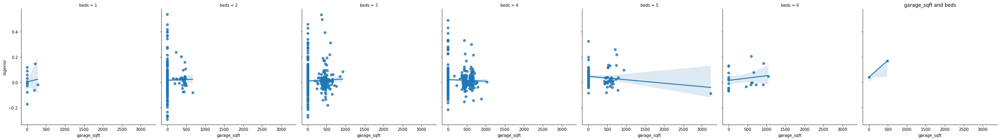

<Figure size 864x576 with 0 Axes>

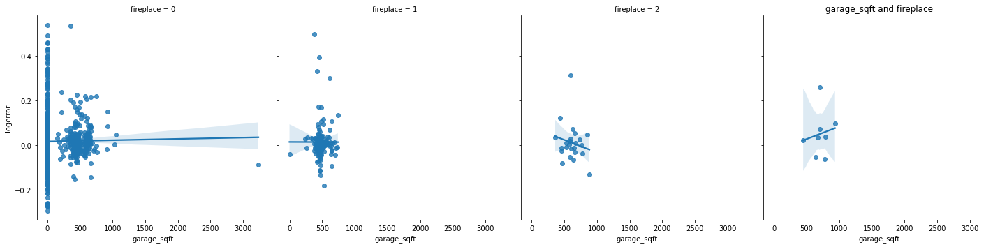

<Figure size 864x576 with 0 Axes>

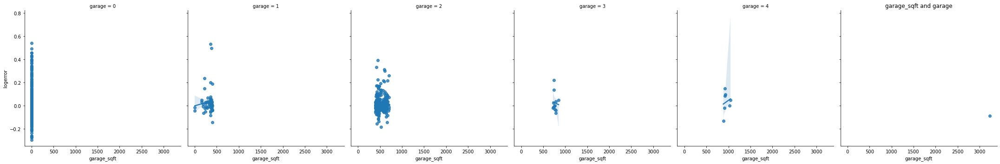

<Figure size 864x576 with 0 Axes>

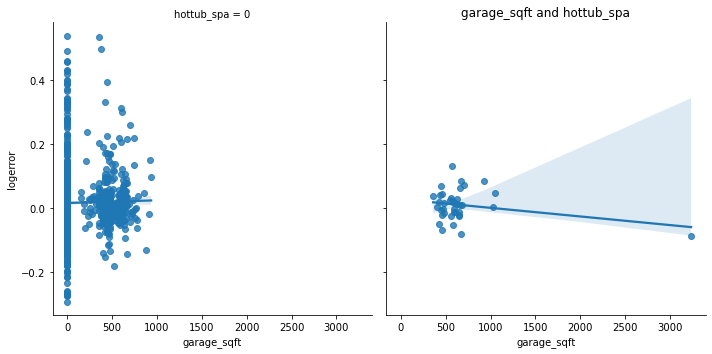

<Figure size 864x576 with 0 Axes>

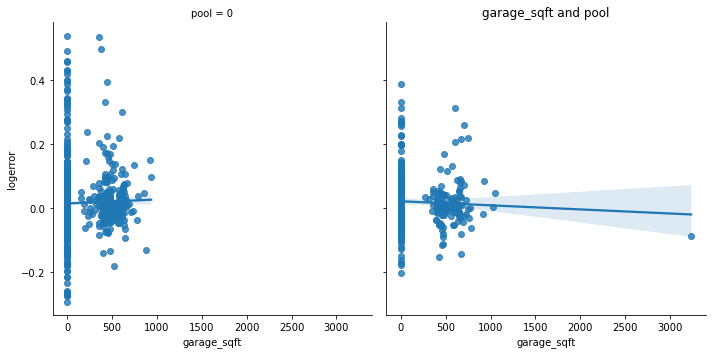

<Figure size 864x576 with 0 Axes>

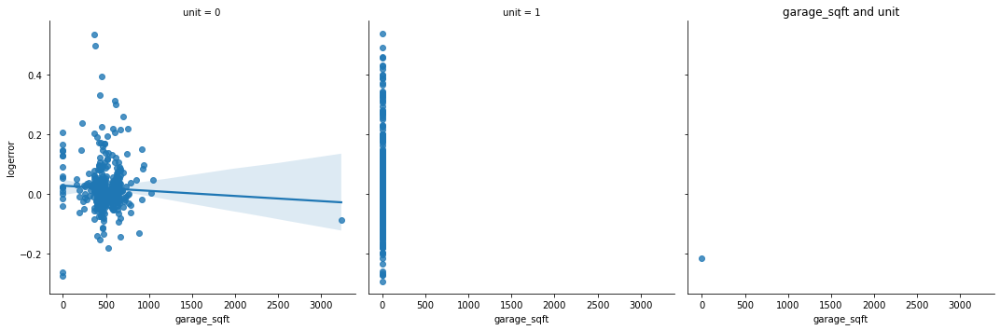

<Figure size 864x576 with 0 Axes>

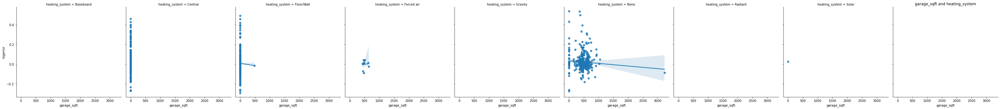

<Figure size 864x576 with 0 Axes>

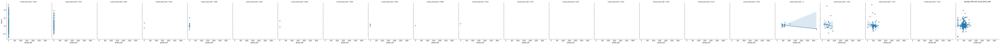

<Figure size 864x576 with 0 Axes>

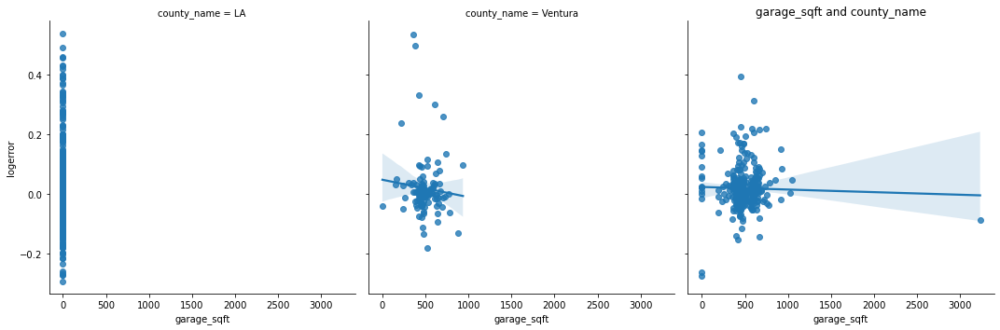

<Figure size 864x576 with 0 Axes>

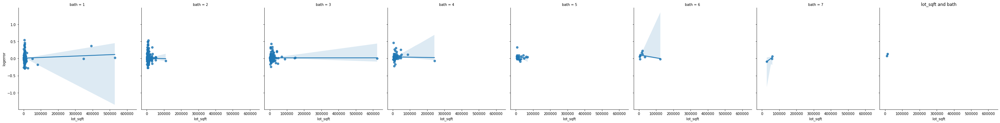

<Figure size 864x576 with 0 Axes>

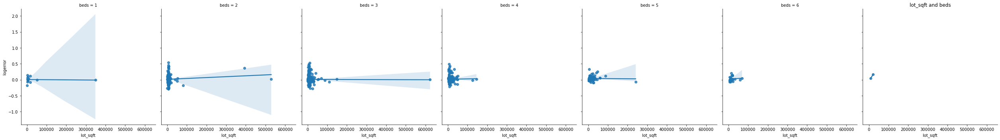

<Figure size 864x576 with 0 Axes>

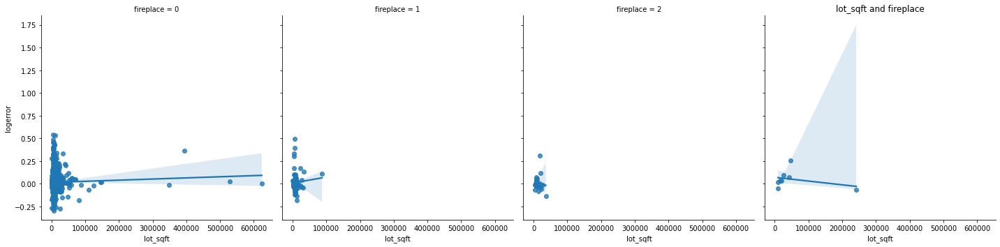

<Figure size 864x576 with 0 Axes>

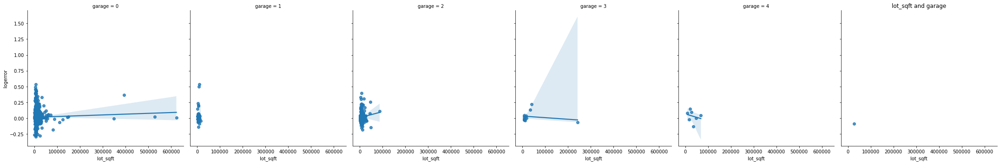

<Figure size 864x576 with 0 Axes>

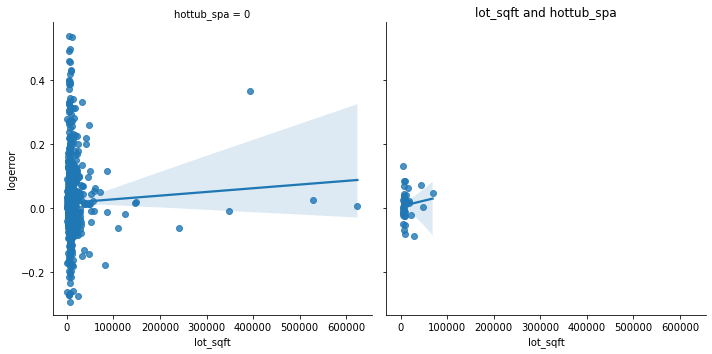

<Figure size 864x576 with 0 Axes>

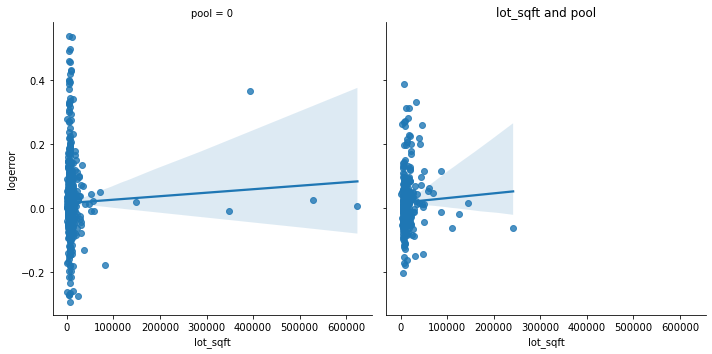

<Figure size 864x576 with 0 Axes>

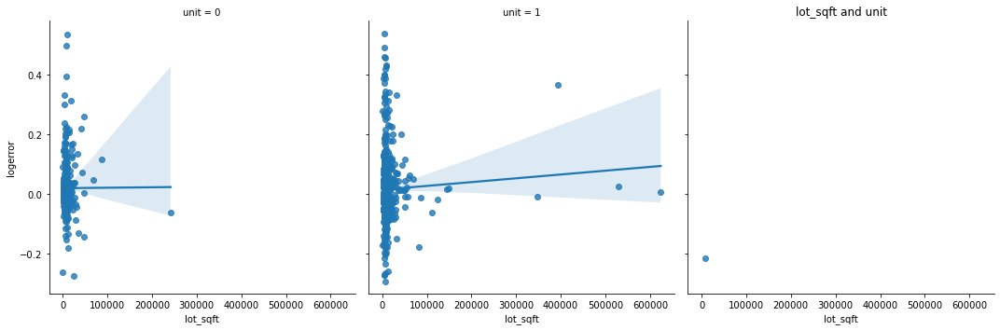

<Figure size 864x576 with 0 Axes>

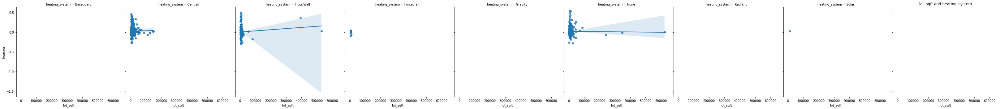

<Figure size 864x576 with 0 Axes>

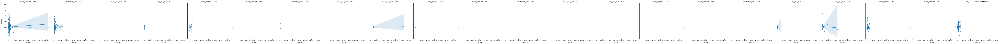

<Figure size 864x576 with 0 Axes>

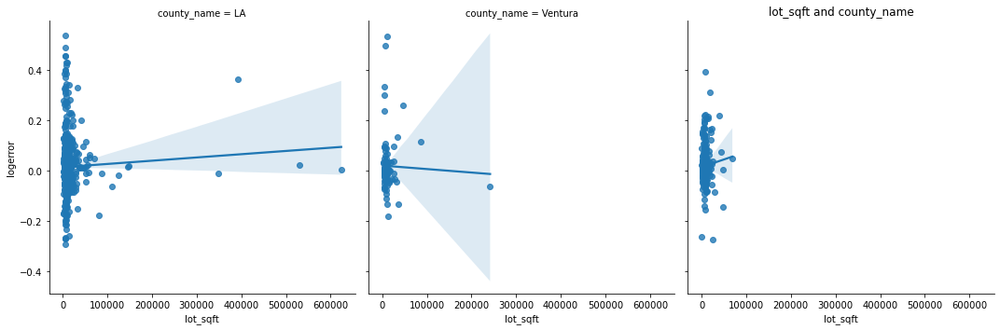

<Figure size 864x576 with 0 Axes>

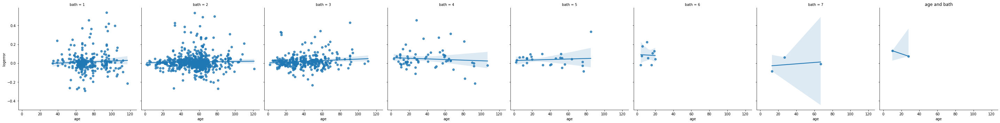

<Figure size 864x576 with 0 Axes>

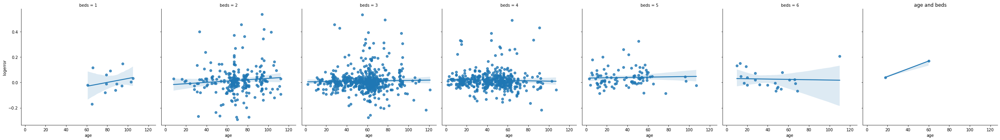

<Figure size 864x576 with 0 Axes>

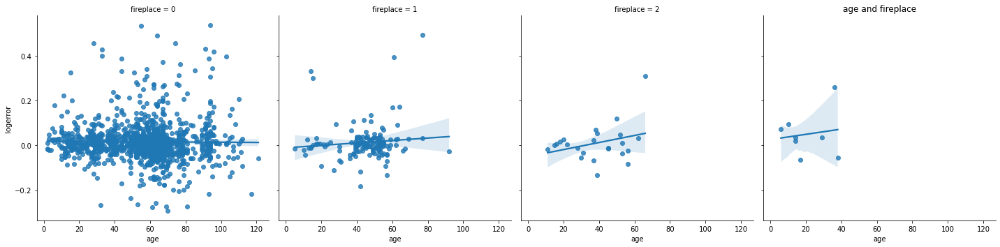

<Figure size 864x576 with 0 Axes>

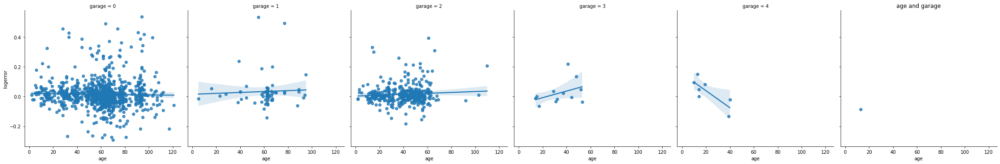

<Figure size 864x576 with 0 Axes>

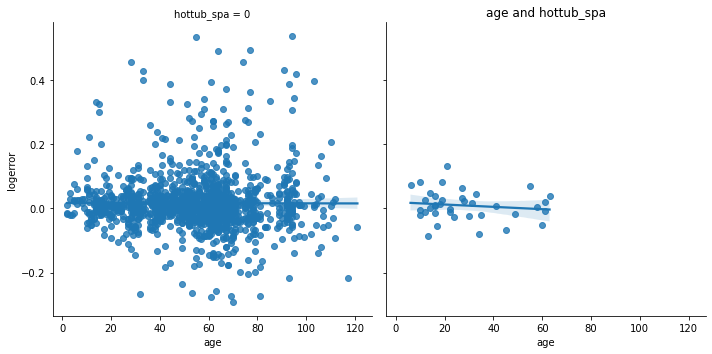

<Figure size 864x576 with 0 Axes>

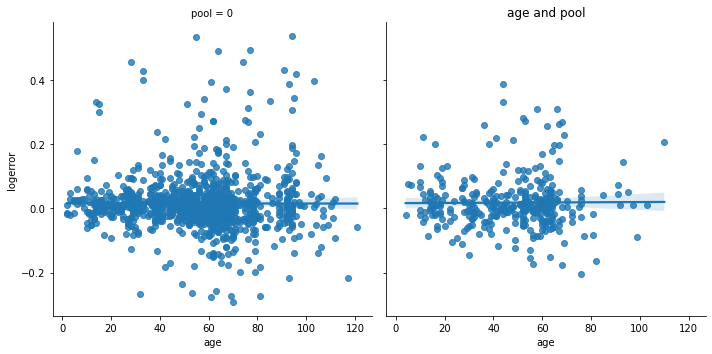

<Figure size 864x576 with 0 Axes>

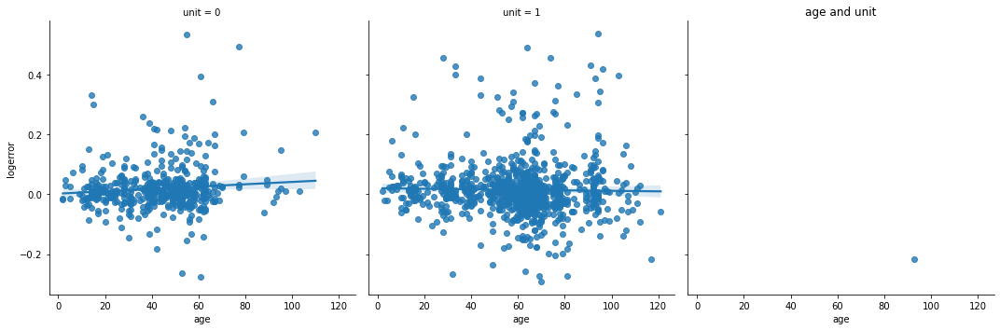

<Figure size 864x576 with 0 Axes>

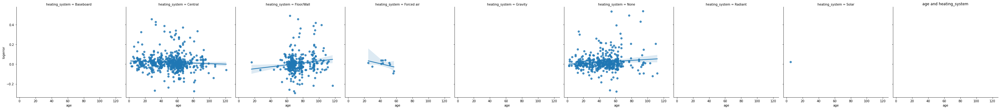

<Figure size 864x576 with 0 Axes>

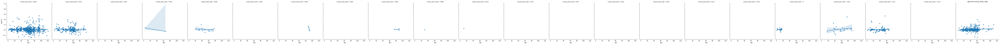

<Figure size 864x576 with 0 Axes>

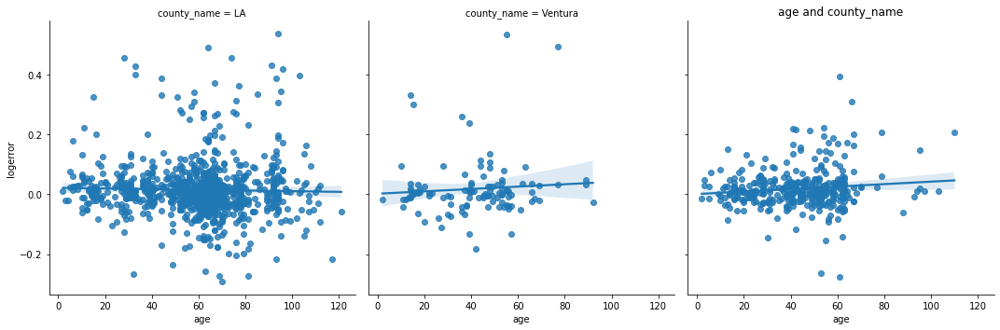

<Figure size 864x576 with 0 Axes>

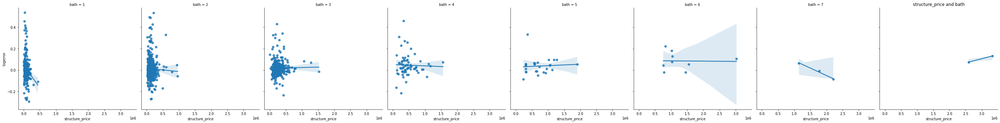

<Figure size 864x576 with 0 Axes>

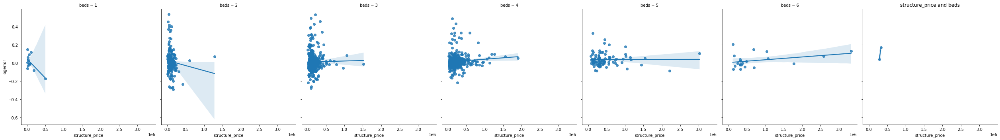

<Figure size 864x576 with 0 Axes>

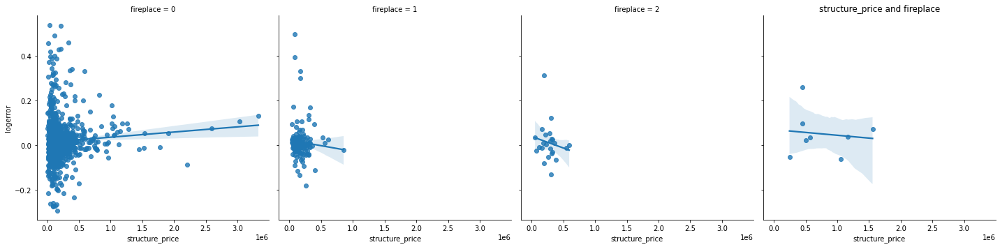

<Figure size 864x576 with 0 Axes>

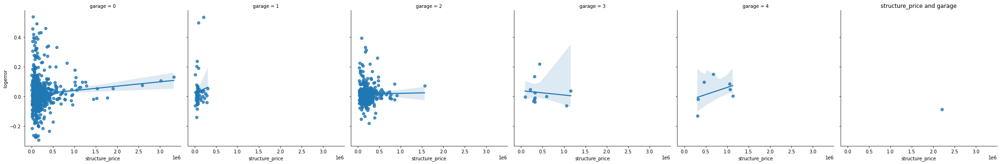

<Figure size 864x576 with 0 Axes>

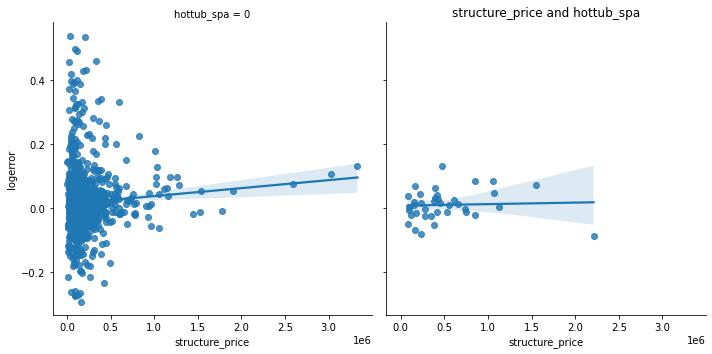

<Figure size 864x576 with 0 Axes>

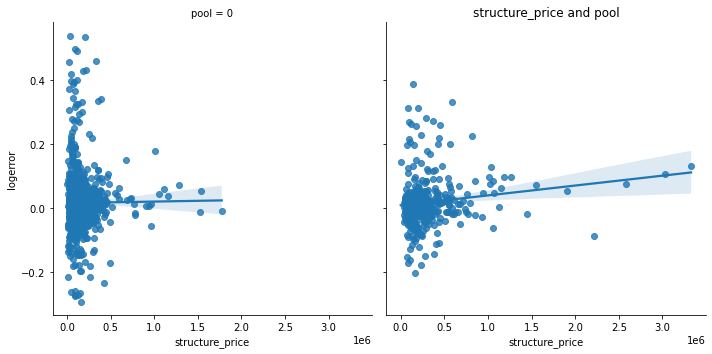

<Figure size 864x576 with 0 Axes>

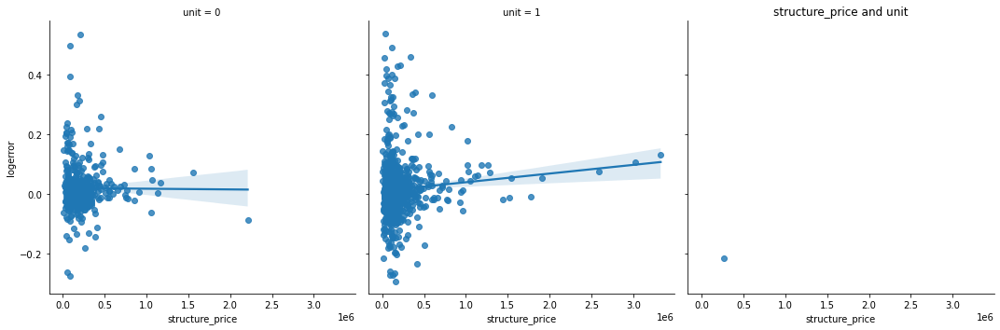

<Figure size 864x576 with 0 Axes>

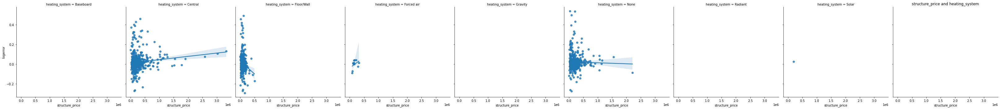

<Figure size 864x576 with 0 Axes>

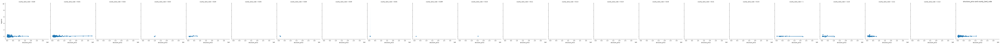

<Figure size 864x576 with 0 Axes>

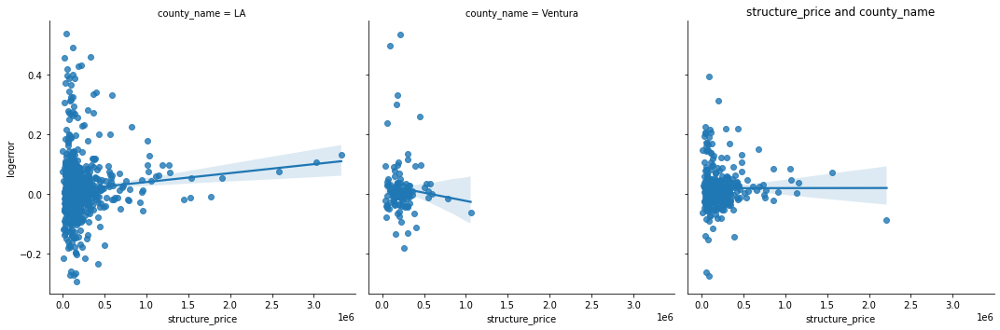

<Figure size 864x576 with 0 Axes>

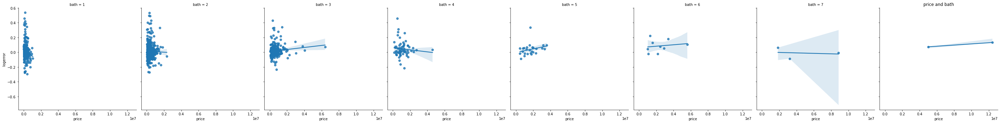

<Figure size 864x576 with 0 Axes>

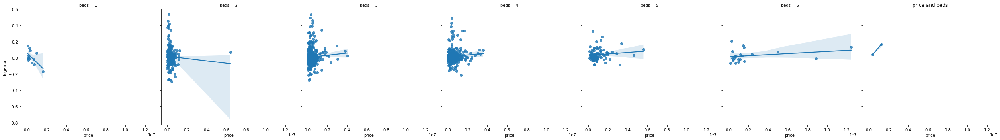

<Figure size 864x576 with 0 Axes>

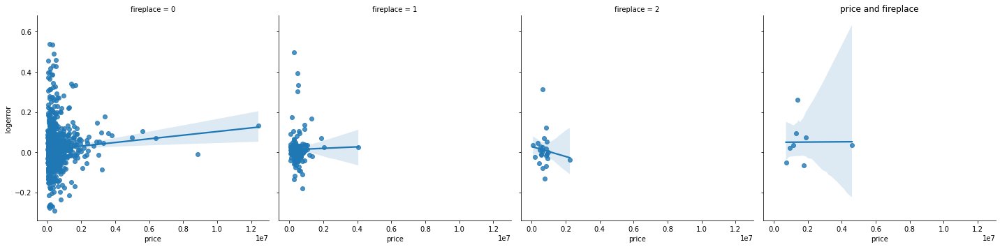

<Figure size 864x576 with 0 Axes>

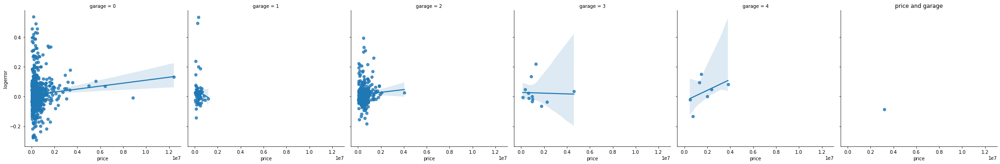

<Figure size 864x576 with 0 Axes>

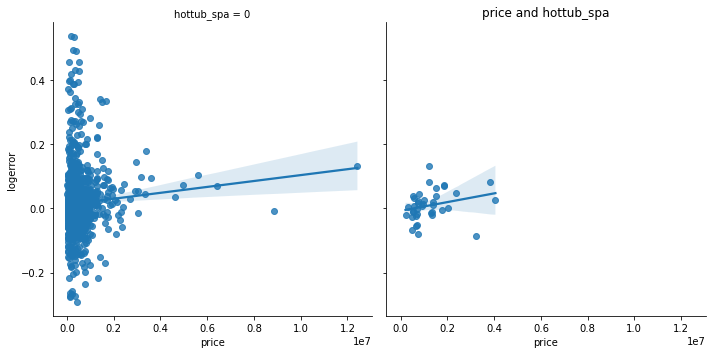

<Figure size 864x576 with 0 Axes>

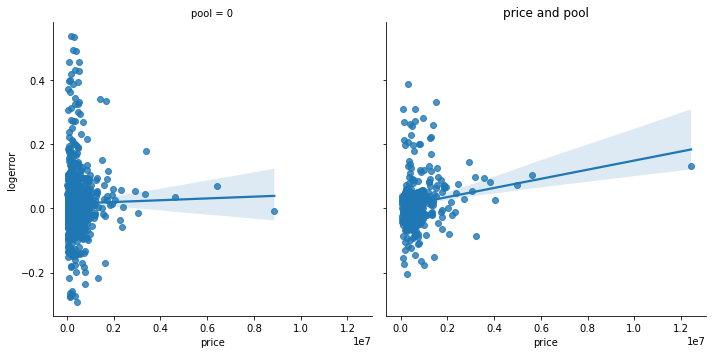

<Figure size 864x576 with 0 Axes>

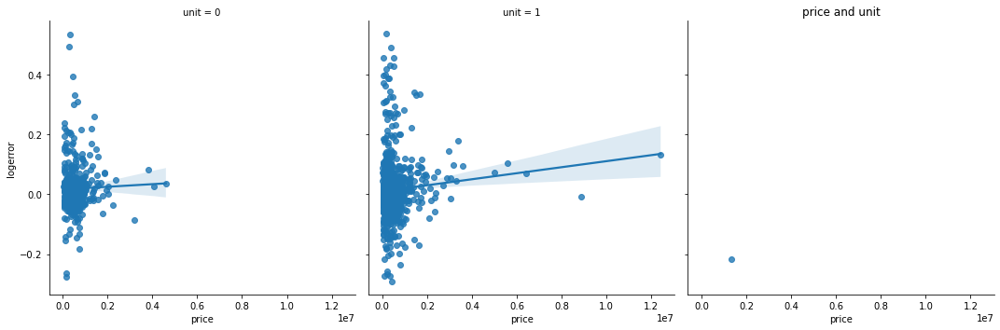

<Figure size 864x576 with 0 Axes>

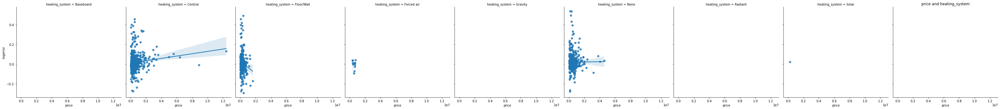

<Figure size 864x576 with 0 Axes>

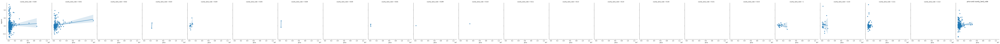

<Figure size 864x576 with 0 Axes>

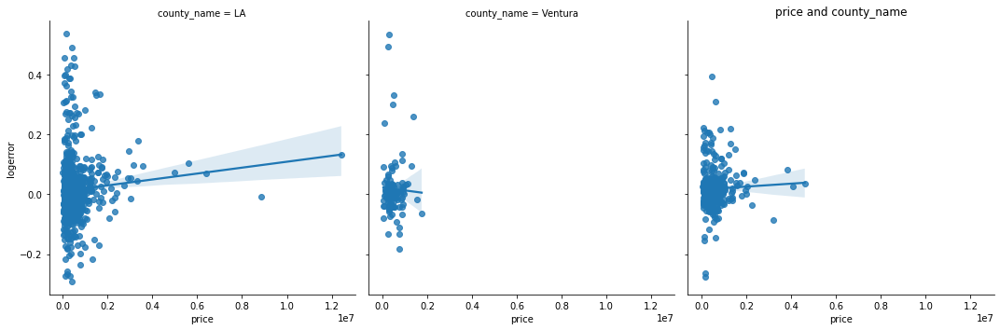

<Figure size 864x576 with 0 Axes>

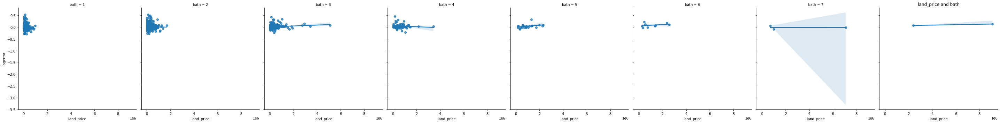

<Figure size 864x576 with 0 Axes>

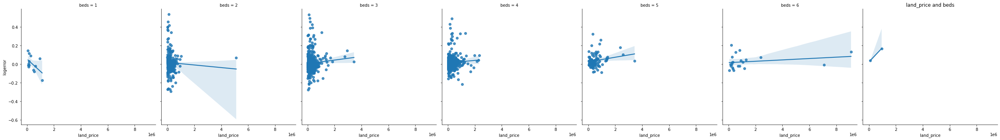

<Figure size 864x576 with 0 Axes>

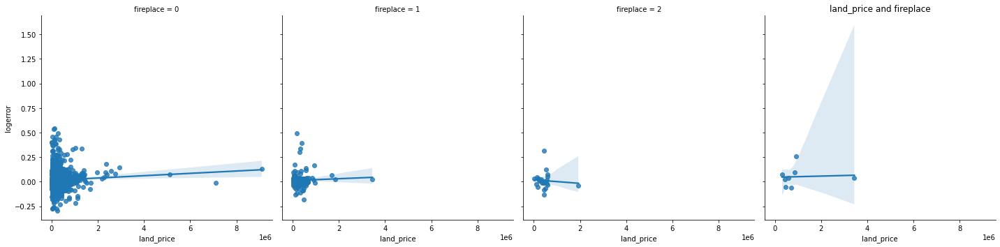

<Figure size 864x576 with 0 Axes>

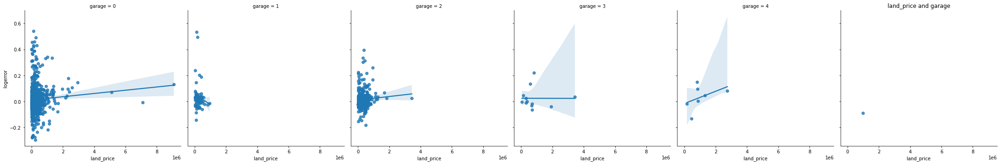

<Figure size 864x576 with 0 Axes>

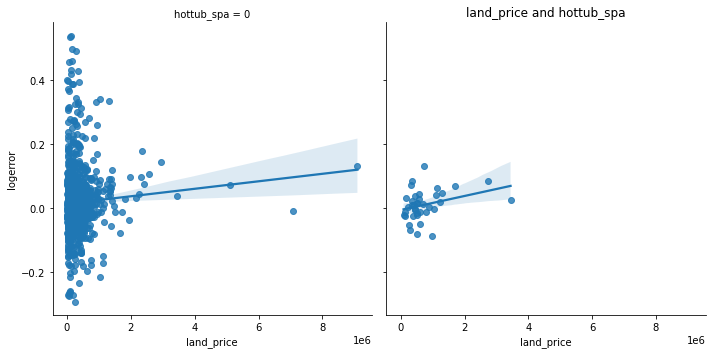

<Figure size 864x576 with 0 Axes>

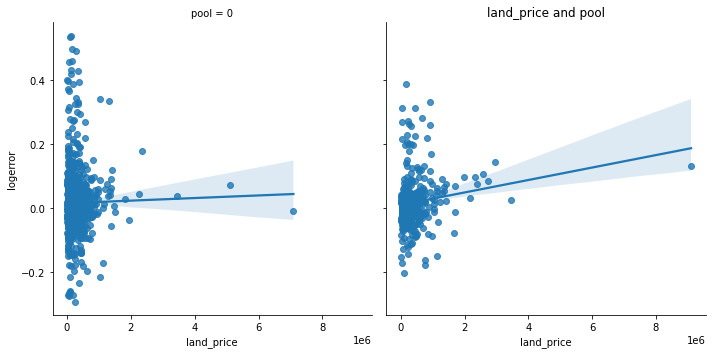

<Figure size 864x576 with 0 Axes>

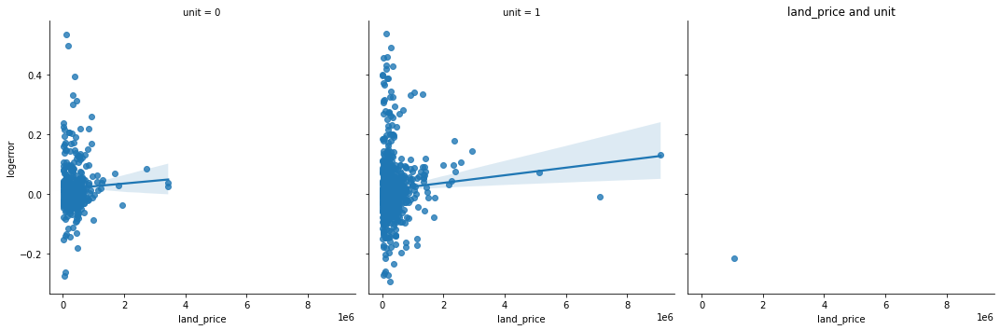

<Figure size 864x576 with 0 Axes>

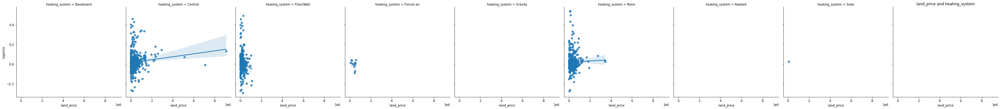

<Figure size 864x576 with 0 Axes>

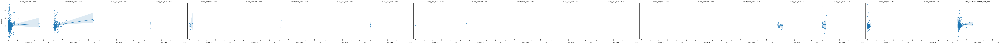

<Figure size 864x576 with 0 Axes>

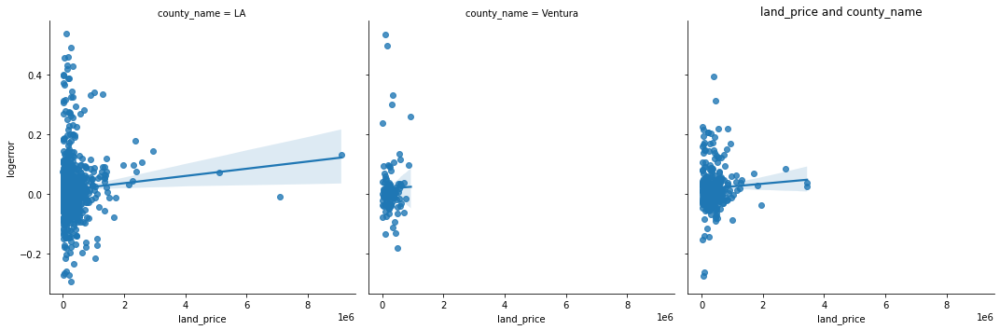

<Figure size 864x576 with 0 Axes>

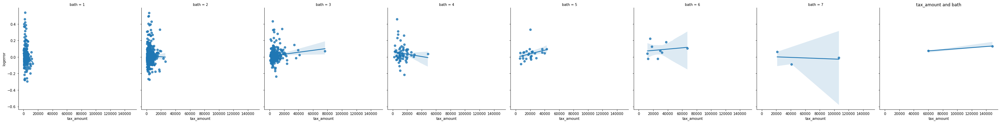

<Figure size 864x576 with 0 Axes>

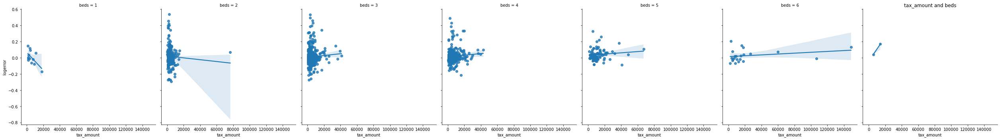

<Figure size 864x576 with 0 Axes>

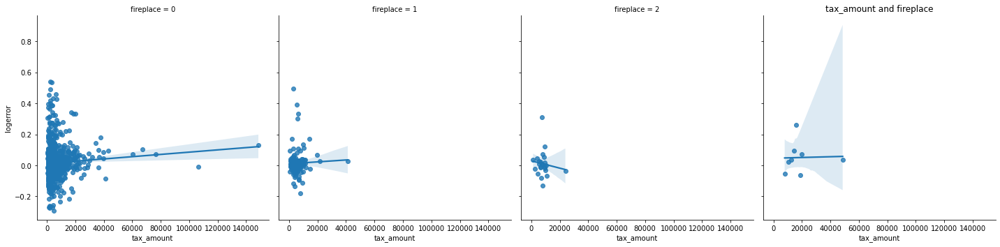

<Figure size 864x576 with 0 Axes>

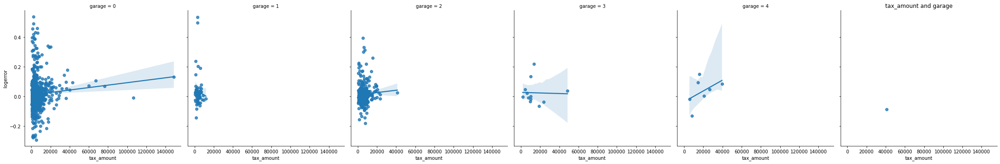

<Figure size 864x576 with 0 Axes>

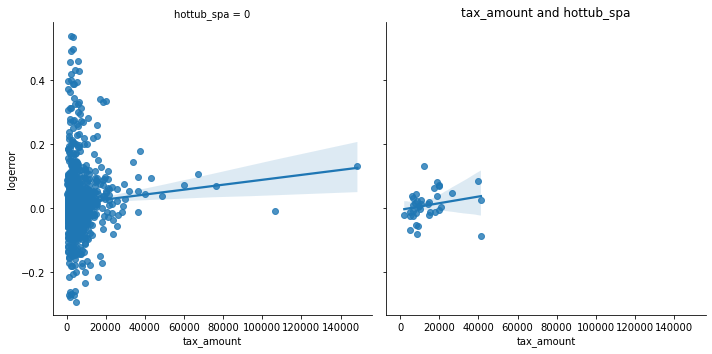

<Figure size 864x576 with 0 Axes>

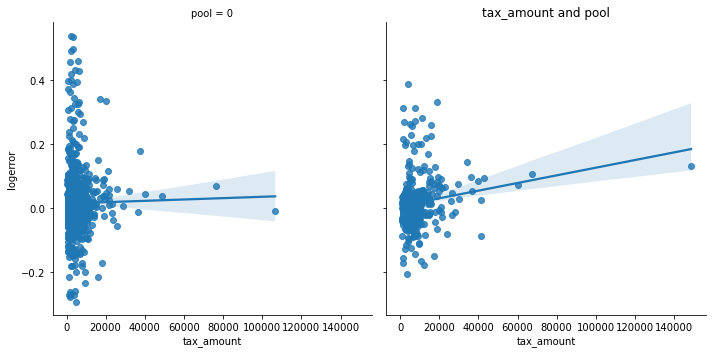

<Figure size 864x576 with 0 Axes>

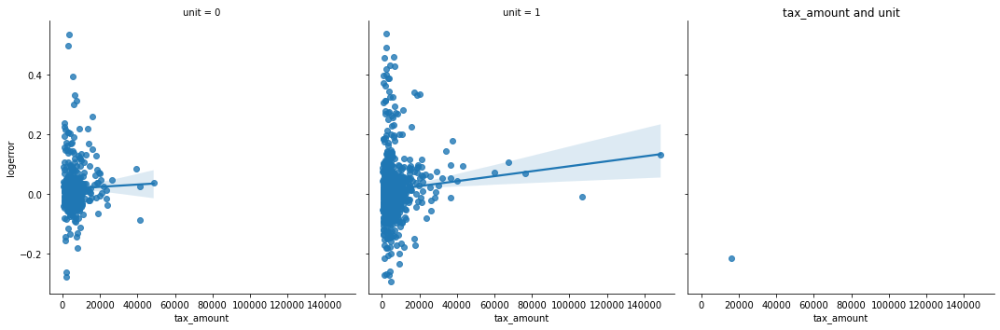

<Figure size 864x576 with 0 Axes>

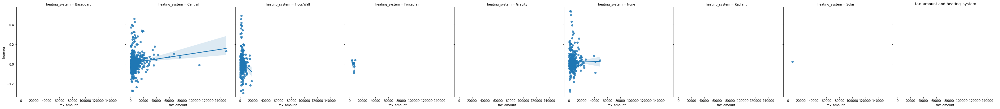

<Figure size 864x576 with 0 Axes>

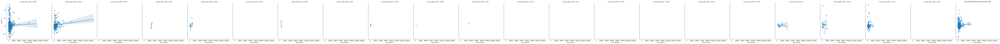

<Figure size 864x576 with 0 Axes>

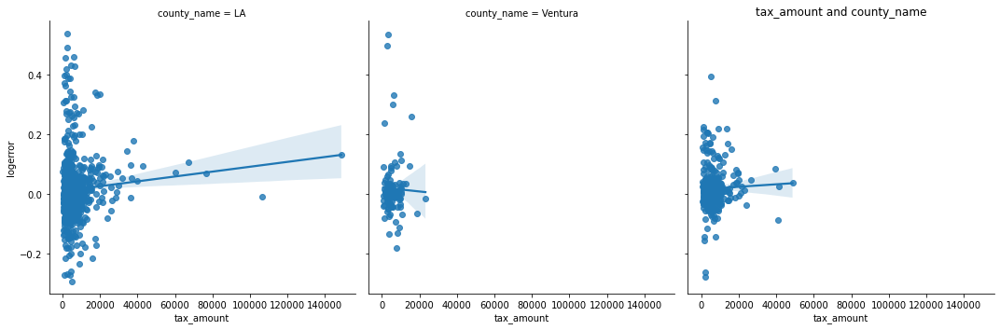

<Figure size 864x576 with 0 Axes>

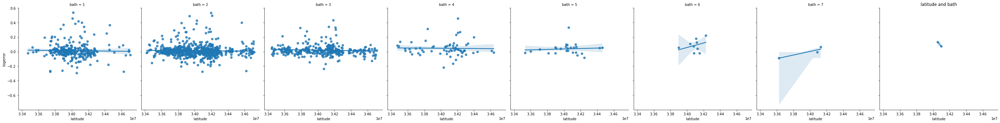

<Figure size 864x576 with 0 Axes>

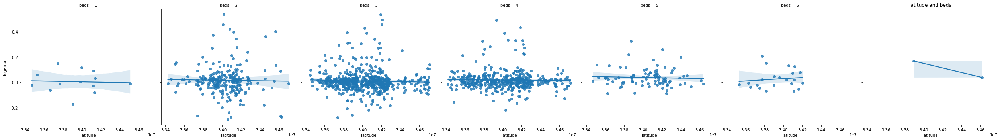

<Figure size 864x576 with 0 Axes>

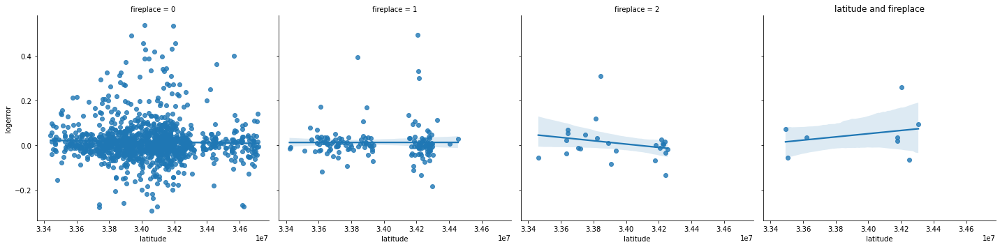

<Figure size 864x576 with 0 Axes>

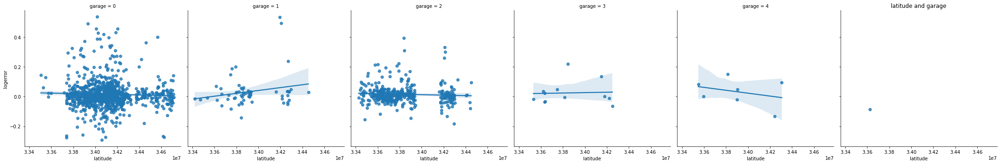

<Figure size 864x576 with 0 Axes>

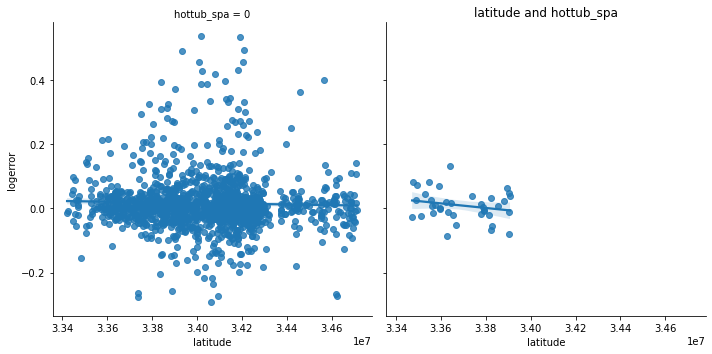

<Figure size 864x576 with 0 Axes>

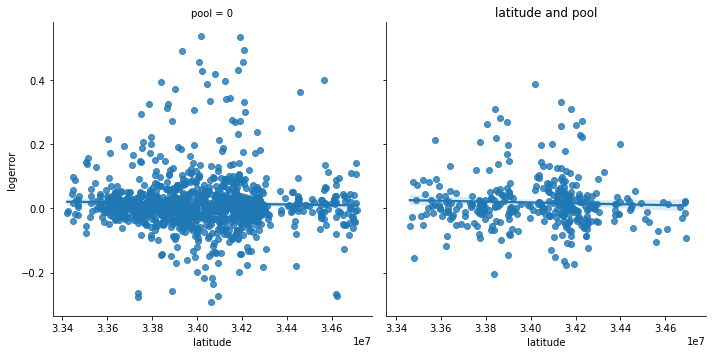

<Figure size 864x576 with 0 Axes>

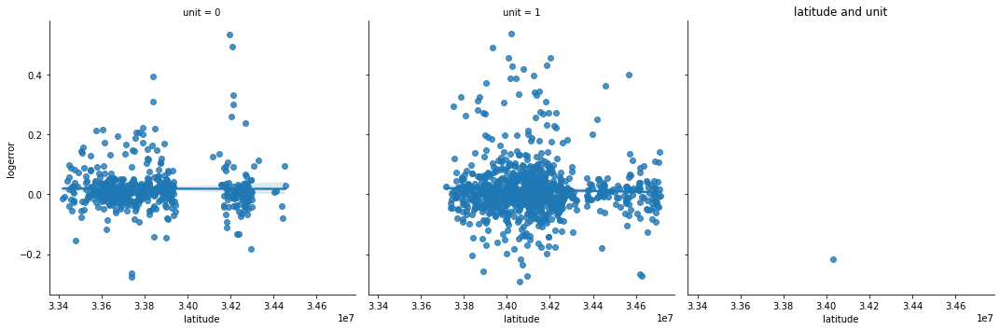

<Figure size 864x576 with 0 Axes>

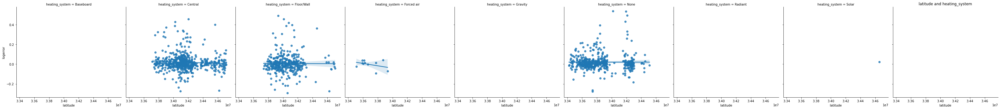

<Figure size 864x576 with 0 Axes>

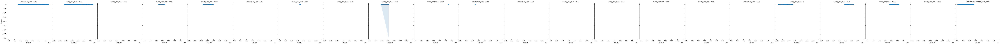

<Figure size 864x576 with 0 Axes>

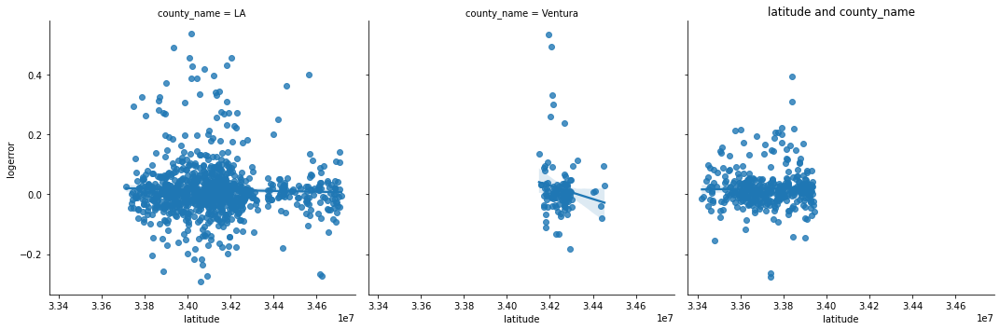

<Figure size 864x576 with 0 Axes>

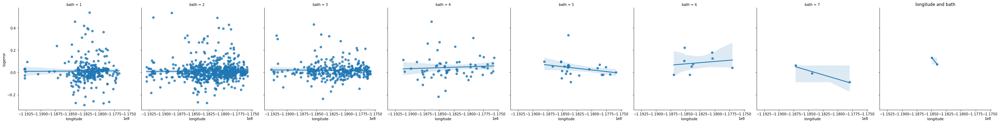

<Figure size 864x576 with 0 Axes>

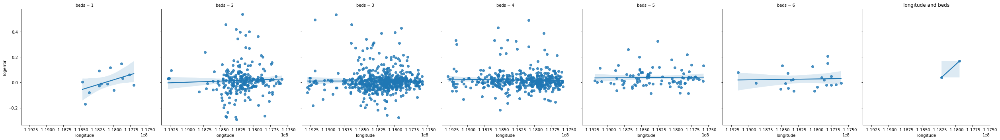

<Figure size 864x576 with 0 Axes>

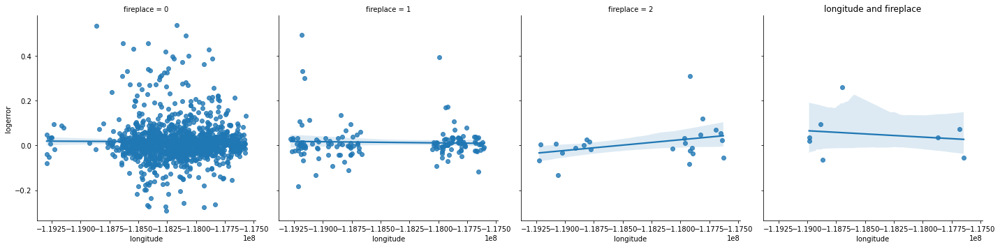

<Figure size 864x576 with 0 Axes>

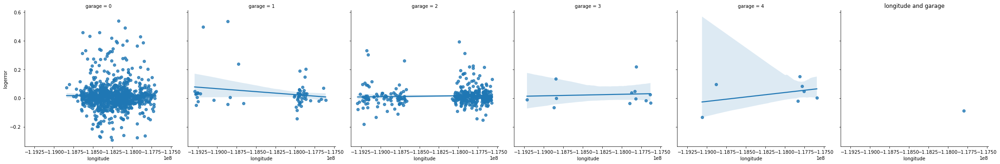

<Figure size 864x576 with 0 Axes>

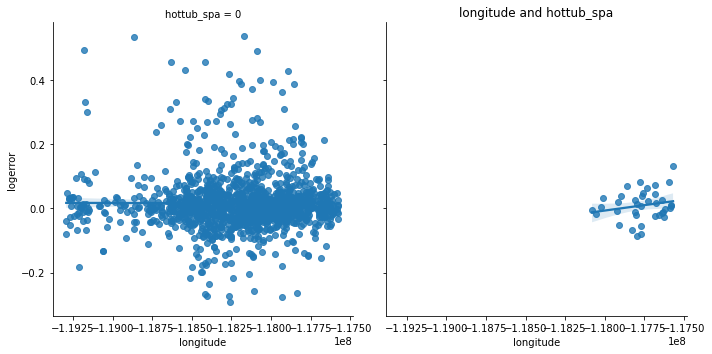

<Figure size 864x576 with 0 Axes>

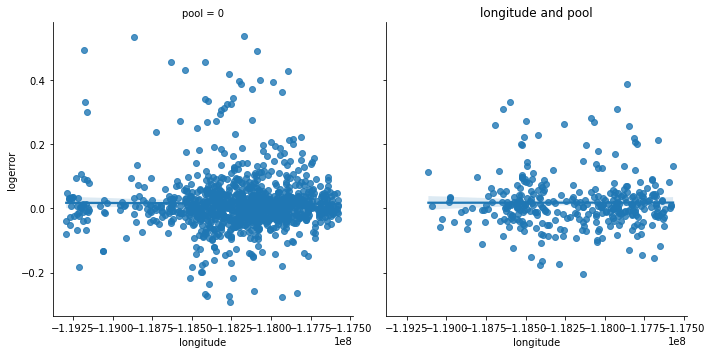

<Figure size 864x576 with 0 Axes>

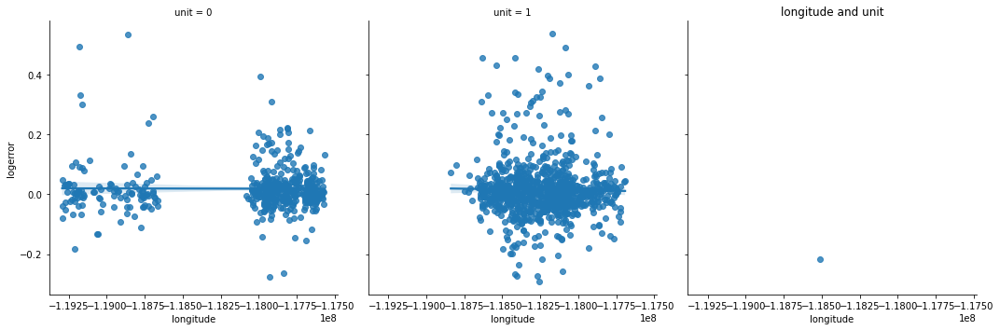

<Figure size 864x576 with 0 Axes>

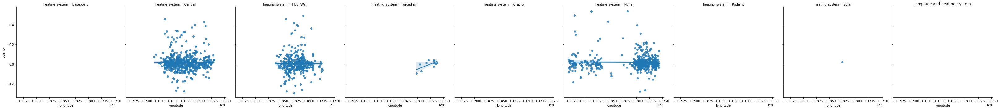

<Figure size 864x576 with 0 Axes>

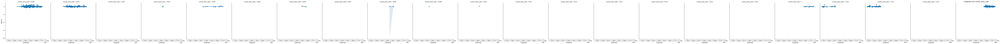

<Figure size 864x576 with 0 Axes>

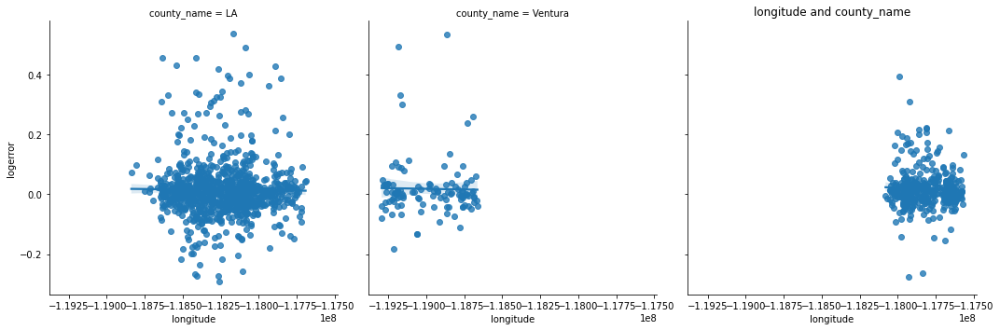

In [123]:
for num in numerical_columns:
    for cat in categorical_columns:
        plt.figure(figsize=(12, 8))
        sns.lmplot(data=sample, x=num, y='logerror', col=cat)
        plt.title(num + ' and ' + cat)
        plt.show()

In [ ]:
plt.figure(figsize=(8, 4))
plt.title('Beds / bath ratio ')
ax = sns.swarmplot(x=(sample.beds / sample.bath), y=target)
plt.ylabel('Absolute value of the logerror')
plt.ylim(0, 0.55)
ax.set(xticks=[0, 1, 2, 3, 4, 5])
ax.set(xticklabels=[0, 1, 2, 3, 4, 5])
plt.show()